# Concatenated prompt hidden-state cosine similarity

This notebook compares hidden states from concatenated concept prompts (`negpos`, `posneg`) directly against the ordinary `positive` and `negative` hidden states. It does not use steering vectors.

For each model, category, pair, variant, and layer, it computes row-wise cosine similarity:

- `cos(negpos, positive)` and `cos(negpos, negative)`
- `cos(posneg, positive)` and `cos(posneg, negative)`

Then it aggregates the trends by layer.

In [1]:
from __future__ import annotations

from pathlib import Path
import os
import re
import warnings

os.environ.setdefault("XDG_CACHE_HOME", "/private/tmp/font-cache")
os.environ.setdefault("MPLCONFIGDIR", "/private/tmp/matplotlib-cache")
Path(os.environ["XDG_CACHE_HOME"]).mkdir(parents=True, exist_ok=True)
Path(os.environ["MPLCONFIGDIR"]).mkdir(parents=True, exist_ok=True)

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

pd.set_option("display.max_columns", 80)
pd.set_option("display.max_rows", 80)

BASE_HIDDEN_ROOT = Path("/Volumes/Lenovo PS10")
CONCAT_HIDDEN_ROOT = Path("/Volumes/Lenovo PS10/hidden_states_negpos_posneg")
OUTPUT_DIR = Path("contrast_sanity_outputs/concatenate_cos")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# Set these to smaller values for a quick smoke run.
MODEL_NAMES = None  # None means auto-discover from CONCAT_HIDDEN_ROOT
CATEGORY_FILTER = None  # example: {"semantic_framing"}
PAIR_LIMIT_PER_CATEGORY = None  # example: 3
LAYER_FILTER = None  # example: set(range(0, 8))

CONCAT_VARIANTS = ("negpos", "posneg")
REFERENCE_VARIANTS = ("positive", "negative")

print("Base hidden root:", BASE_HIDDEN_ROOT)
print("Concat hidden root:", CONCAT_HIDDEN_ROOT)
print("Output dir:", OUTPUT_DIR.resolve())

Base hidden root: /Volumes/Lenovo PS10
Concat hidden root: /Volumes/Lenovo PS10/hidden_states_negpos_posneg
Output dir: /Users/xinmingwang/Library/CloudStorage/OneDrive-NationalUniversityofSingapore/Wisc/contrast_sanity_outputs/concatenate_cos


In [2]:
def discover_models() -> list[str]:
    if MODEL_NAMES is not None:
        return list(MODEL_NAMES)
    if not CONCAT_HIDDEN_ROOT.exists():
        raise FileNotFoundError(f"Missing concat root: {CONCAT_HIDDEN_ROOT}")
    models = []
    for path in sorted(CONCAT_HIDDEN_ROOT.iterdir()):
        if path.is_dir() and not path.name.startswith("._") and (BASE_HIDDEN_ROOT / path.name).exists():
            models.append(path.name)
    return models


def layer_number(path: Path) -> int:
    match = re.fullmatch(r"layer_(\d+)\.npy", path.name)
    if match is None:
        raise ValueError(f"Not a layer file: {path}")
    return int(match.group(1))


def valid_layer_files(variant_dir: Path) -> dict[int, Path]:
    if not variant_dir.exists():
        return {}
    files = {}
    for path in variant_dir.glob("layer_*.npy"):
        if path.name.startswith("._"):
            continue
        layer = layer_number(path)
        if LAYER_FILTER is None or layer in LAYER_FILTER:
            files[layer] = path
    return files


def iter_concat_pair_dirs(model_name: str):
    model_root = CONCAT_HIDDEN_ROOT / model_name
    for category_dir in sorted(model_root.iterdir()):
        if not category_dir.is_dir() or category_dir.name.startswith("._"):
            continue
        if CATEGORY_FILTER is not None and category_dir.name not in CATEGORY_FILTER:
            continue
        emitted = 0
        for pair_dir in sorted(category_dir.iterdir()):
            if not pair_dir.is_dir() or pair_dir.name.startswith("._"):
                continue
            if PAIR_LIMIT_PER_CATEGORY is not None and emitted >= PAIR_LIMIT_PER_CATEGORY:
                break
            emitted += 1
            yield category_dir.name, pair_dir.name, pair_dir


def rowwise_cosine(a: np.ndarray, b: np.ndarray, eps: float = 1e-12) -> np.ndarray:
    a = np.asarray(a, dtype=np.float64)
    b = np.asarray(b, dtype=np.float64)
    if a.ndim == 1:
        a = a[None, :]
    if b.ndim == 1:
        b = b[None, :]
    if a.shape[1] != b.shape[1]:
        raise ValueError(f"Hidden dimensions differ: {a.shape} vs {b.shape}")
    n = min(a.shape[0], b.shape[0])
    a = a[:n]
    b = b[:n]
    numer = np.sum(a * b, axis=1)
    denom = np.linalg.norm(a, axis=1) * np.linalg.norm(b, axis=1)
    return numer / np.maximum(denom, eps)


def cosine_summary(concat_path: Path, reference_path: Path) -> dict[str, float | int]:
    concat_hidden = np.load(concat_path, mmap_mode="r")
    reference_hidden = np.load(reference_path, mmap_mode="r")
    sims = rowwise_cosine(concat_hidden, reference_hidden)
    return {
        "mean_cos": float(np.mean(sims)),
        "std_cos": float(np.std(sims, ddof=1)) if sims.size > 1 else 0.0,
        "n_rows": int(sims.size),
    }


def compute_concatenate_cosines() -> tuple[pd.DataFrame, pd.DataFrame]:
    rows = []
    problems = []
    models = discover_models()
    print("Models:", models)

    for model_name in models:
        print(f"Scanning {model_name}...")
        for category, pair_slug, concat_pair_dir in iter_concat_pair_dirs(model_name):
            base_pair_dir = BASE_HIDDEN_ROOT / model_name / category / pair_slug
            for concat_variant in CONCAT_VARIANTS:
                concat_layers = valid_layer_files(concat_pair_dir / concat_variant)
                for reference_variant in REFERENCE_VARIANTS:
                    reference_layers = valid_layer_files(base_pair_dir / reference_variant)
                    common_layers = sorted(set(concat_layers) & set(reference_layers))
                    missing_layers = sorted(set(concat_layers) - set(reference_layers))
                    if missing_layers:
                        problems.append({
                            "model": model_name,
                            "category": category,
                            "pair_slug": pair_slug,
                            "concat_variant": concat_variant,
                            "reference_variant": reference_variant,
                            "problem": f"Missing reference layers: {missing_layers[:10]}",
                        })
                    for layer in common_layers:
                        try:
                            summary = cosine_summary(concat_layers[layer], reference_layers[layer])
                        except Exception as exc:
                            problems.append({
                                "model": model_name,
                                "category": category,
                                "pair_slug": pair_slug,
                                "concat_variant": concat_variant,
                                "reference_variant": reference_variant,
                                "layer": layer,
                                "problem": repr(exc),
                            })
                            continue
                        rows.append({
                            "model": model_name,
                            "category": category,
                            "pair_slug": pair_slug,
                            "concat_variant": concat_variant,
                            "reference_variant": reference_variant,
                            "layer": layer,
                            **summary,
                        })

    result = pd.DataFrame(rows)
    problem_df = pd.DataFrame(problems)
    return result, problem_df

In [3]:
cos_df, problems_df = compute_concatenate_cosines()

cos_path = OUTPUT_DIR / "concatenate_vs_posneg_layer_cosines.csv"
problem_path = OUTPUT_DIR / "concatenate_vs_posneg_problems.csv"
cos_df.to_csv(cos_path, index=False)
problems_df.to_csv(problem_path, index=False)

print(f"Rows: {len(cos_df):,}")
print(f"Problems: {len(problems_df):,}")
print("Saved:", cos_path)
print("Saved:", problem_path)

display(cos_df.head())
display(problems_df.head())

Models: ['Llama-3.2-3B-Instruct', 'Qwen2.5-1.5B-Instruct', 'Qwen2.5-3B-Instruct']
Scanning Llama-3.2-3B-Instruct...
Scanning Qwen2.5-1.5B-Instruct...
Scanning Qwen2.5-3B-Instruct...
Rows: 55,200
Problems: 0
Saved: contrast_sanity_outputs/concatenate_cos/concatenate_vs_posneg_layer_cosines.csv
Saved: contrast_sanity_outputs/concatenate_cos/concatenate_vs_posneg_problems.csv


,model,category,pair_slug,concat_variant,reference_variant,layer,mean_cos,std_cos,n_rows
0,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,positive,0,0.997827,0.001194,100
1,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,positive,1,0.996952,0.001225,100
2,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,positive,2,0.994929,0.001411,100
3,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,positive,3,0.977592,0.004652,100
4,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,positive,4,0.923803,0.023374,100


""


In [4]:
if cos_df.empty:
    raise RuntimeError("No cosine rows were computed. Check the hidden-state roots and filters.")

agg_df = (
    cos_df
    .groupby(["model", "concat_variant", "reference_variant", "layer"], as_index=False)
    .agg(
        mean_cos=("mean_cos", "mean"),
        std_across_pairs=("mean_cos", "std"),
        n_pairs=("pair_slug", "nunique"),
        n_rows_total=("n_rows", "sum"),
    )
)
agg_df["sem_across_pairs"] = agg_df["std_across_pairs"] / np.sqrt(agg_df["n_pairs"].clip(lower=1))

diff_df = (
    cos_df
    .pivot_table(
        index=["model", "category", "pair_slug", "concat_variant", "layer"],
        columns="reference_variant",
        values="mean_cos",
        aggfunc="mean",
    )
    .reset_index()
)
diff_df["positive_minus_negative"] = diff_df["positive"] - diff_df["negative"]

agg_path = OUTPUT_DIR / "concatenate_vs_posneg_layer_cosines_aggregated.csv"
diff_path = OUTPUT_DIR / "concatenate_pos_minus_neg_by_pair_layer.csv"
agg_df.to_csv(agg_path, index=False)
diff_df.to_csv(diff_path, index=False)

print("Saved:", agg_path)
print("Saved:", diff_path)
display(agg_df.head())
display(diff_df.head())

Saved: contrast_sanity_outputs/concatenate_cos/concatenate_vs_posneg_layer_cosines_aggregated.csv
Saved: contrast_sanity_outputs/concatenate_cos/concatenate_pos_minus_neg_by_pair_layer.csv


,model,concat_variant,reference_variant,layer,mean_cos,std_across_pairs,n_pairs,n_rows_total,sem_across_pairs
0,Llama-3.2-3B-Instruct,negpos,negative,0,0.998378,0.000277,150,15000,0.000023
1,Llama-3.2-3B-Instruct,negpos,negative,1,0.997557,0.000262,150,15000,0.000021
2,Llama-3.2-3B-Instruct,negpos,negative,2,0.995728,0.000261,150,15000,0.000021
3,Llama-3.2-3B-Instruct,negpos,negative,3,0.982003,0.001389,150,15000,0.000113
4,Llama-3.2-3B-Instruct,negpos,negative,4,0.933101,0.003709,150,15000,0.000303


reference_variant,model,category,pair_slug,concat_variant,layer,negative,positive,positive_minus_negative
0,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,0,0.998457,0.997827,-0.000630
1,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,1,0.997626,0.996952,-0.000673
2,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,2,0.995862,0.994929,-0.000933
3,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,3,0.983389,0.977592,-0.005797
4,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,4,0.935791,0.923803,-0.011988


Saved: contrast_sanity_outputs/concatenate_cos/Llama-3.2-3B-Instruct_concatenate_vs_posneg_layer_trends.png


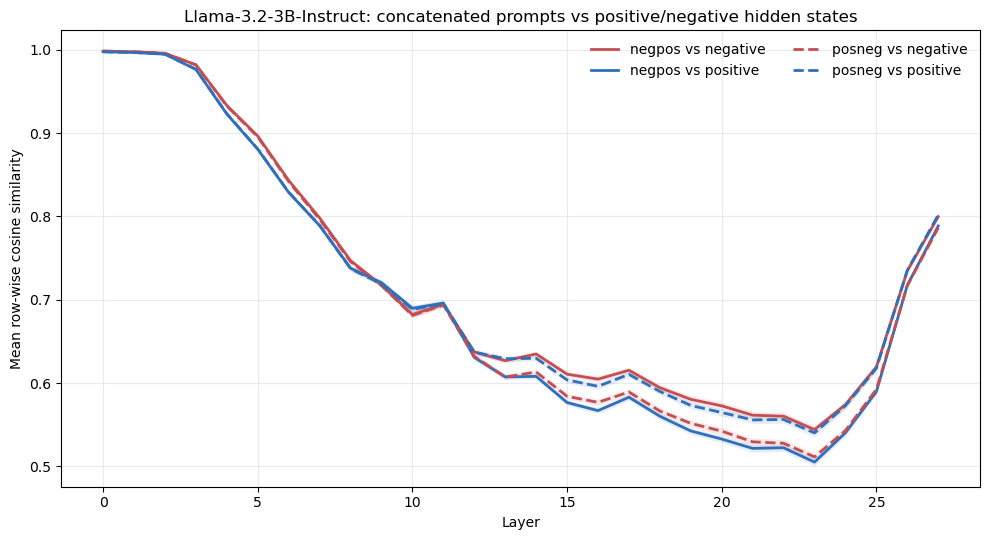

Saved: contrast_sanity_outputs/concatenate_cos/Qwen2.5-1.5B-Instruct_concatenate_vs_posneg_layer_trends.png


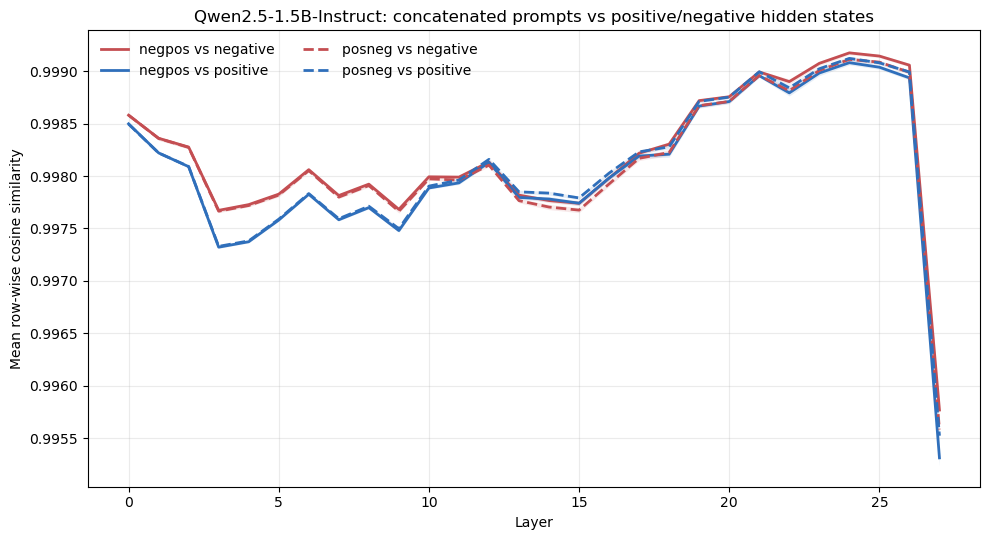

Saved: contrast_sanity_outputs/concatenate_cos/Qwen2.5-3B-Instruct_concatenate_vs_posneg_layer_trends.png


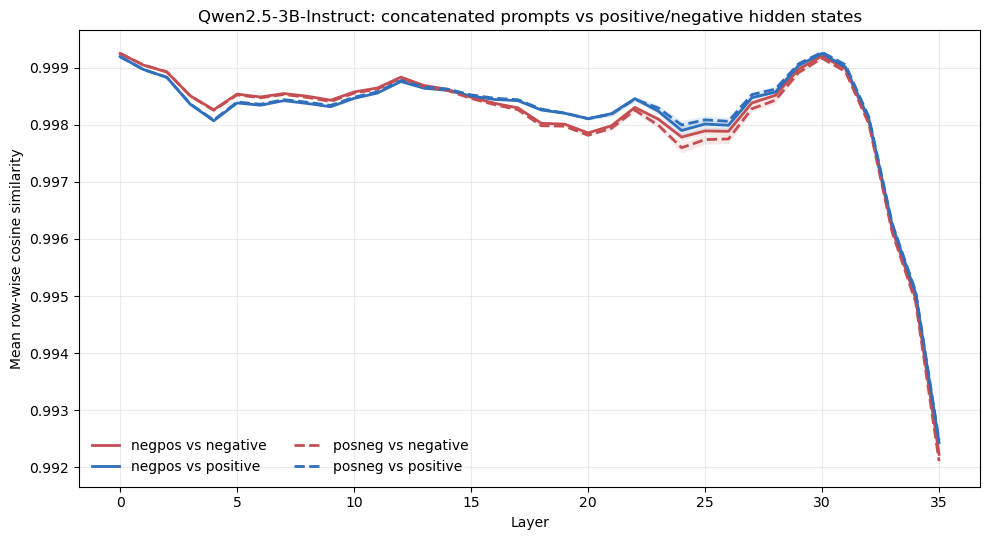

In [5]:
STYLE = {
    ("negpos", "positive"): {"color": "#2f6fbb", "linestyle": "-", "label": "negpos vs positive"},
    ("negpos", "negative"): {"color": "#c44e52", "linestyle": "-", "label": "negpos vs negative"},
    ("posneg", "positive"): {"color": "#2f6fbb", "linestyle": "--", "label": "posneg vs positive"},
    ("posneg", "negative"): {"color": "#c44e52", "linestyle": "--", "label": "posneg vs negative"},
}


def plot_layer_trends(agg: pd.DataFrame, output_dir: Path = OUTPUT_DIR) -> None:
    for model_name, model_df in agg.groupby("model"):
        fig, ax = plt.subplots(figsize=(10, 5.5))
        for (concat_variant, reference_variant), group_df in model_df.groupby(["concat_variant", "reference_variant"]):
            group_df = group_df.sort_values("layer")
            style = STYLE[(concat_variant, reference_variant)]
            ax.plot(
                group_df["layer"],
                group_df["mean_cos"],
                color=style["color"],
                linestyle=style["linestyle"],
                linewidth=2,
                label=style["label"],
            )
            ax.fill_between(
                group_df["layer"].to_numpy(),
                (group_df["mean_cos"] - group_df["sem_across_pairs"]).to_numpy(),
                (group_df["mean_cos"] + group_df["sem_across_pairs"]).to_numpy(),
                color=style["color"],
                alpha=0.12,
                linewidth=0,
            )
        ax.set_title(f"{model_name}: concatenated prompts vs positive/negative hidden states")
        ax.set_xlabel("Layer")
        ax.set_ylabel("Mean row-wise cosine similarity")
        ax.grid(alpha=0.25)
        ax.legend(frameon=False, ncols=2)
        fig.tight_layout()
        out_path = output_dir / f"{model_name}_concatenate_vs_posneg_layer_trends.png"
        fig.savefig(out_path, dpi=180)
        print("Saved:", out_path)
        plt.show()


plot_layer_trends(agg_df)

## Global-mean-centered overall cosine similarity

Estimate one global mean vector per `model + layer` from the reference hidden states (`base`, `positive`, `negative`) across all categories, pairs, and samples. Then recompute the original four concat-vs-pos/neg cosine similarities after subtracting that layer's global mean.


In [11]:
GLOBAL_MEAN_REFERENCE_VARIANTS = ("base", "positive", "negative")
GLOBAL_MEAN_DIR = OUTPUT_DIR / "global_means_reference_base_positive_negative"
GLOBAL_MEAN_DIR.mkdir(parents=True, exist_ok=True)


def layer_file_for(
    root: Path,
    model_name: str,
    category: str,
    pair_slug: str,
    variant: str,
    layer: int,
) -> Path:
    return root / model_name / category / pair_slug / variant / f"layer_{layer}.npy"


def expected_model_layers(model_name: str) -> list[int]:
    return sorted(cos_df.loc[cos_df["model"].eq(model_name), "layer"].unique().tolist())


def load_cached_global_means(model_name: str, expected_layers: list[int]) -> dict[int, np.ndarray] | None:
    model_mean_dir = GLOBAL_MEAN_DIR / model_name
    means = {}
    for layer in expected_layers:
        mean_path = model_mean_dir / f"layer_{layer}.npy"
        if not mean_path.exists():
            return None
        means[layer] = np.load(mean_path)
    print(f"{model_name}: loaded cached global means for {len(means)} layers", flush=True)
    return means


def compute_global_means_for_model(model_name: str) -> dict[int, np.ndarray]:
    expected_layers = expected_model_layers(model_name)
    cached = load_cached_global_means(model_name, expected_layers)
    if cached is not None:
        return cached

    sums: dict[int, np.ndarray] = {}
    counts: dict[int, int] = {}
    used_files = 0
    problem_files = []

    pair_rows = (
        cos_df.loc[cos_df["model"].eq(model_name), ["category", "pair_slug"]]
        .drop_duplicates()
        .sort_values(["category", "pair_slug"])
    )
    print(
        f"{model_name}: computing global mean from {len(pair_rows)} pairs, "
        f"{len(expected_layers)} layers, variants={GLOBAL_MEAN_REFERENCE_VARIANTS}",
        flush=True,
    )

    for pair_idx, row in enumerate(pair_rows.itertuples(index=False), start=1):
        if pair_idx == 1 or pair_idx % 25 == 0 or pair_idx == len(pair_rows):
            print(f"  {model_name}: global mean pair {pair_idx}/{len(pair_rows)}", flush=True)
        category = row.category
        pair_slug = row.pair_slug
        for reference_variant in GLOBAL_MEAN_REFERENCE_VARIANTS:
            for layer in expected_layers:
                layer_path = layer_file_for(
                    BASE_HIDDEN_ROOT,
                    model_name,
                    category,
                    pair_slug,
                    reference_variant,
                    int(layer),
                )
                if not layer_path.exists():
                    problem_files.append(str(layer_path))
                    continue
                arr = np.load(layer_path, mmap_mode="r")
                if arr.ndim == 1:
                    arr = arr[None, :]
                arr_sum = np.asarray(arr, dtype=np.float64).sum(axis=0)
                if layer not in sums:
                    sums[layer] = arr_sum
                    counts[layer] = int(arr.shape[0])
                else:
                    sums[layer] += arr_sum
                    counts[layer] += int(arr.shape[0])
                used_files += 1

    if not sums:
        raise RuntimeError(f"No reference hidden states found for global mean: {model_name}")
    if problem_files:
        warnings.warn(
            f"{model_name}: missing {len(problem_files)} reference files while computing global mean. "
            f"First missing: {problem_files[0]}"
        )

    means = {layer: sums[layer] / counts[layer] for layer in sorted(sums)}
    model_mean_dir = GLOBAL_MEAN_DIR / model_name
    model_mean_dir.mkdir(parents=True, exist_ok=True)
    for layer, mean_vec in means.items():
        np.save(model_mean_dir / f"layer_{layer}.npy", mean_vec.astype(np.float32))

    print(f"{model_name}: computed global means for {len(means)} layers from {used_files} files", flush=True)
    return means


def compute_global_means(models: list[str]) -> dict[str, dict[int, np.ndarray]]:
    global_means = {}
    for model_name in models:
        global_means[model_name] = compute_global_means_for_model(model_name)
    return global_means


def centered_cosine_summary(
    concat_path: Path,
    reference_path: Path,
    global_mean: np.ndarray,
) -> dict[str, float | int]:
    concat_hidden = np.asarray(np.load(concat_path, mmap_mode="r"), dtype=np.float64)
    reference_hidden = np.asarray(np.load(reference_path, mmap_mode="r"), dtype=np.float64)
    if concat_hidden.ndim == 1:
        concat_hidden = concat_hidden[None, :]
    if reference_hidden.ndim == 1:
        reference_hidden = reference_hidden[None, :]
    if concat_hidden.shape[1] != global_mean.shape[0] or reference_hidden.shape[1] != global_mean.shape[0]:
        raise ValueError(
            f"Global mean dimension mismatch: concat={concat_hidden.shape}, "
            f"reference={reference_hidden.shape}, mean={global_mean.shape}"
        )
    sims = rowwise_cosine(concat_hidden - global_mean, reference_hidden - global_mean)
    return {
        "mean_cos": float(np.mean(sims)),
        "std_cos": float(np.std(sims, ddof=1)) if sims.size > 1 else 0.0,
        "n_rows": int(sims.size),
    }


def compute_global_mean_centered_cosines(
    global_means: dict[str, dict[int, np.ndarray]],
) -> tuple[pd.DataFrame, pd.DataFrame]:
    rows = []
    problems = []
    work_df = cos_df[["model", "category", "pair_slug", "concat_variant", "reference_variant", "layer"]].drop_duplicates()
    total = len(work_df)
    print(f"Centered cosine work rows: {total}", flush=True)

    for row_idx, row in enumerate(work_df.itertuples(index=False), start=1):
        if row_idx == 1 or row_idx % 5000 == 0 or row_idx == total:
            print(f"  centered cosine row {row_idx}/{total}", flush=True)
        model_name = row.model
        category = row.category
        pair_slug = row.pair_slug
        concat_variant = row.concat_variant
        reference_variant = row.reference_variant
        layer = int(row.layer)
        concat_path = layer_file_for(CONCAT_HIDDEN_ROOT, model_name, category, pair_slug, concat_variant, layer)
        reference_path = layer_file_for(BASE_HIDDEN_ROOT, model_name, category, pair_slug, reference_variant, layer)
        try:
            summary = centered_cosine_summary(
                concat_path,
                reference_path,
                global_means[model_name][layer],
            )
        except Exception as exc:
            problems.append({
                "model": model_name,
                "category": category,
                "pair_slug": pair_slug,
                "concat_variant": concat_variant,
                "reference_variant": reference_variant,
                "layer": layer,
                "problem": repr(exc),
            })
            continue
        rows.append({
            "model": model_name,
            "category": category,
            "pair_slug": pair_slug,
            "concat_variant": concat_variant,
            "reference_variant": reference_variant,
            "layer": layer,
            **summary,
        })
    return pd.DataFrame(rows), pd.DataFrame(problems)


models = discover_models()
global_means = compute_global_means(models)
global_centered_df, global_centered_problems_df = compute_global_mean_centered_cosines(global_means)

global_centered_path = OUTPUT_DIR / "global_mean_centered_layer_cosines.csv"
global_centered_problem_path = OUTPUT_DIR / "global_mean_centered_problems.csv"
global_centered_df.to_csv(global_centered_path, index=False)
global_centered_problems_df.to_csv(global_centered_problem_path, index=False)
print("Saved:", global_centered_path)
print("Saved:", global_centered_problem_path)
print(f"Rows: {len(global_centered_df):,}")
print(f"Problems: {len(global_centered_problems_df):,}")
display(global_centered_df.head())
display(global_centered_problems_df.head())


Llama-3.2-3B-Instruct: loaded cached global means for 28 layers
Qwen2.5-1.5B-Instruct: loaded cached global means for 28 layers
Qwen2.5-3B-Instruct: loaded cached global means for 36 layers
Centered cosine work rows: 55200
  centered cosine row 1/55200
  centered cosine row 5000/55200
  centered cosine row 10000/55200
  centered cosine row 15000/55200
  centered cosine row 20000/55200
  centered cosine row 25000/55200
  centered cosine row 30000/55200
  centered cosine row 35000/55200
  centered cosine row 40000/55200
  centered cosine row 45000/55200
  centered cosine row 50000/55200
  centered cosine row 55000/55200
  centered cosine row 55200/55200
Saved: contrast_sanity_outputs/concatenate_cos/global_mean_centered_layer_cosines.csv
Saved: contrast_sanity_outputs/concatenate_cos/global_mean_centered_problems.csv
Rows: 55,200
Problems: 0


,model,category,pair_slug,concat_variant,reference_variant,layer,mean_cos,std_cos,n_rows
0,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,positive,0,0.411167,0.144001,100
1,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,positive,1,0.372543,0.130786,100
2,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,positive,2,0.357872,0.103923,100
3,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,positive,3,0.271326,0.096947,100
4,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,positive,4,0.108966,0.182415,100


""


Saved: contrast_sanity_outputs/concatenate_cos/global_mean_centered_layer_cosines_aggregated.csv


,model,concat_variant,reference_variant,layer,mean_cos,std_across_pairs,n_pairs,n_rows_total,sem_across_pairs
0,Llama-3.2-3B-Instruct,negpos,negative,0,0.501141,0.116759,150,15000,0.009533
1,Llama-3.2-3B-Instruct,negpos,negative,1,0.453746,0.093566,150,15000,0.007640
2,Llama-3.2-3B-Instruct,negpos,negative,2,0.445235,0.066831,150,15000,0.005457
3,Llama-3.2-3B-Instruct,negpos,negative,3,0.383753,0.040712,150,15000,0.003324
4,Llama-3.2-3B-Instruct,negpos,negative,4,0.234035,0.031639,150,15000,0.002583


Saved: contrast_sanity_outputs/concatenate_cos/global_mean_centered_overall_trends/Llama-3.2-3B-Instruct_global_mean_centered_overall_layer_trends.png


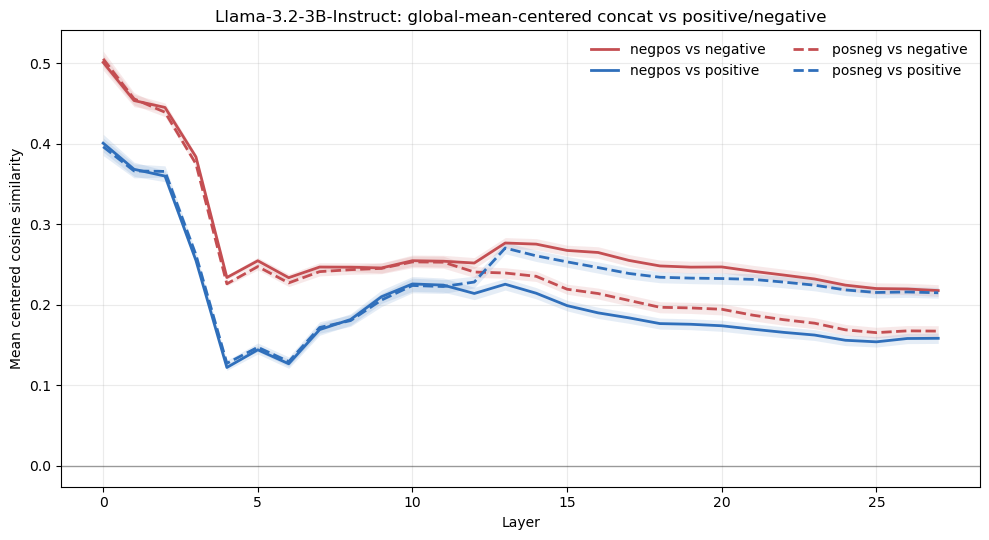

Saved: contrast_sanity_outputs/concatenate_cos/global_mean_centered_overall_trends/Qwen2.5-1.5B-Instruct_global_mean_centered_overall_layer_trends.png


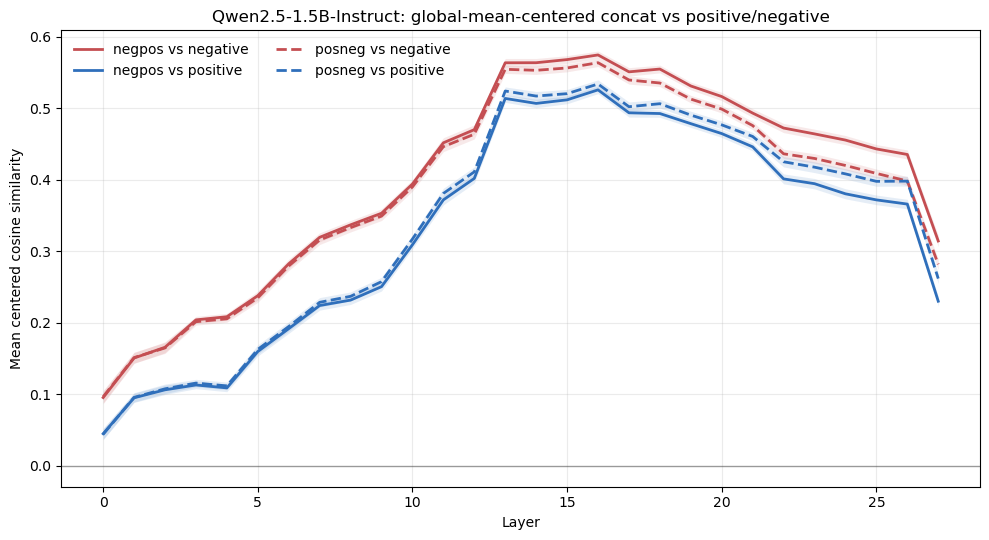

Saved: contrast_sanity_outputs/concatenate_cos/global_mean_centered_overall_trends/Qwen2.5-3B-Instruct_global_mean_centered_overall_layer_trends.png


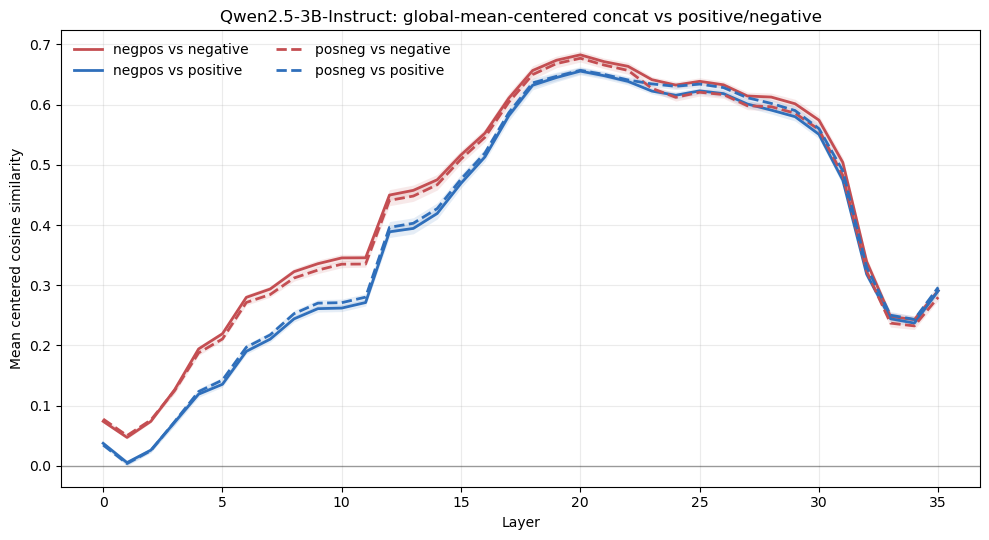

In [12]:
global_centered_agg_df = (
    global_centered_df
    .groupby(["model", "concat_variant", "reference_variant", "layer"], as_index=False)
    .agg(
        mean_cos=("mean_cos", "mean"),
        std_across_pairs=("mean_cos", "std"),
        n_pairs=("pair_slug", "nunique"),
        n_rows_total=("n_rows", "sum"),
    )
)
global_centered_agg_df["sem_across_pairs"] = global_centered_agg_df["std_across_pairs"] / np.sqrt(
    global_centered_agg_df["n_pairs"].clip(lower=1)
)

global_centered_agg_path = OUTPUT_DIR / "global_mean_centered_layer_cosines_aggregated.csv"
global_centered_agg_df.to_csv(global_centered_agg_path, index=False)
print("Saved:", global_centered_agg_path)
display(global_centered_agg_df.head())

centered_plot_dir = OUTPUT_DIR / "global_mean_centered_overall_trends"
centered_plot_dir.mkdir(parents=True, exist_ok=True)

for model_name, model_df in global_centered_agg_df.groupby("model"):
    fig, ax = plt.subplots(figsize=(10, 5.5))
    for (concat_variant, reference_variant), group_df in model_df.groupby(["concat_variant", "reference_variant"]):
        group_df = group_df.sort_values("layer")
        style = STYLE[(concat_variant, reference_variant)]
        ax.plot(
            group_df["layer"],
            group_df["mean_cos"],
            color=style["color"],
            linestyle=style["linestyle"],
            linewidth=2,
            label=style["label"],
        )
        ax.fill_between(
            group_df["layer"].to_numpy(),
            (group_df["mean_cos"] - group_df["sem_across_pairs"]).to_numpy(),
            (group_df["mean_cos"] + group_df["sem_across_pairs"]).to_numpy(),
            color=style["color"],
            alpha=0.12,
            linewidth=0,
        )
    ax.axhline(0, color="black", linewidth=1, alpha=0.35)
    ax.set_title(f"{model_name}: global-mean-centered concat vs positive/negative")
    ax.set_xlabel("Layer")
    ax.set_ylabel("Mean centered cosine similarity")
    ax.grid(alpha=0.25)
    ax.legend(frameon=False, ncols=2)
    fig.tight_layout()
    out_path = centered_plot_dir / f"{model_name}_global_mean_centered_overall_layer_trends.png"
    fig.savefig(out_path, dpi=180)
    print("Saved:", out_path)
    plt.show()


## Global-mean-centered category-level cosine means

Same category-level plots as the raw analysis, but using `global_centered_df`. Each line is the global-mean-centered cosine mean for one concat/reference condition within a category.


Saved: contrast_sanity_outputs/concatenate_cos/global_mean_centered_category_layer_cosine_means.csv
Saved: contrast_sanity_outputs/concatenate_cos/global_mean_centered_category_overall_cosine_means.csv


,model,category,concat_variant,reference_variant,mean_cos,std_across_pair_layers,n_pairs,n_layers,n_rows_total
0,Llama-3.2-3B-Instruct,ideology,negpos,negative,0.286650,0.097378,50,28,140000
1,Llama-3.2-3B-Instruct,ideology,negpos,positive,0.223521,0.094283,50,28,140000
2,Llama-3.2-3B-Instruct,ideology,posneg,negative,0.262978,0.106816,50,28,140000
3,Llama-3.2-3B-Instruct,ideology,posneg,positive,0.250955,0.097605,50,28,140000
4,Llama-3.2-3B-Instruct,linguistic_style,negpos,negative,0.295060,0.127813,50,28,140000
5,Llama-3.2-3B-Instruct,linguistic_style,negpos,positive,0.210834,0.124084,50,28,140000
6,Llama-3.2-3B-Instruct,linguistic_style,posneg,negative,0.267760,0.129952,50,28,140000
7,Llama-3.2-3B-Instruct,linguistic_style,posneg,positive,0.234778,0.121804,50,28,140000
8,Llama-3.2-3B-Instruct,semantic_framing,negpos,negative,0.241580,0.092646,50,28,140000
9,Llama-3.2-3B-Instruct,semantic_framing,negpos,positive,0.173143,0.103065,50,28,140000


Saved: contrast_sanity_outputs/concatenate_cos/global_mean_centered_category_layer_trends/Llama-3.2-3B-Instruct_ideology_global_mean_centered_category_layer_trends.png


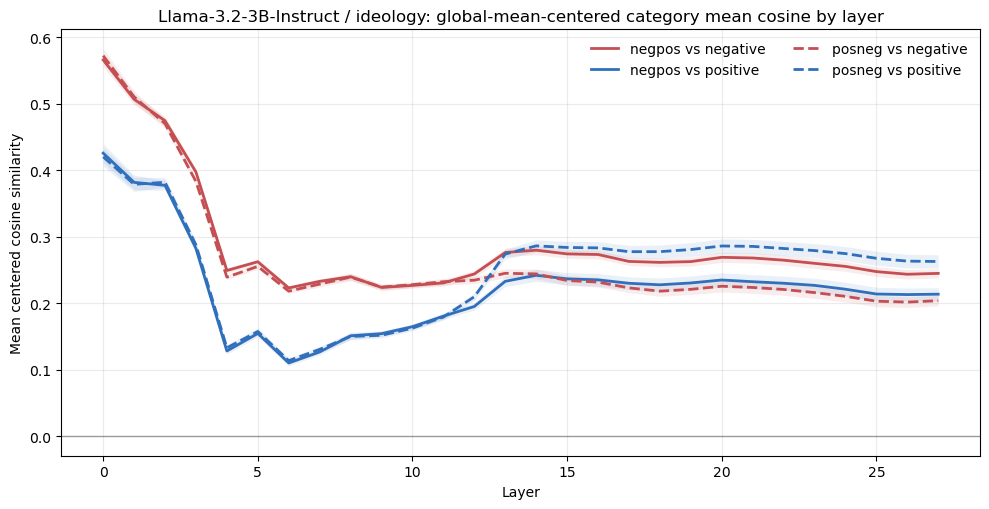

Saved: contrast_sanity_outputs/concatenate_cos/global_mean_centered_category_layer_trends/Llama-3.2-3B-Instruct_linguistic_style_global_mean_centered_category_layer_trends.png


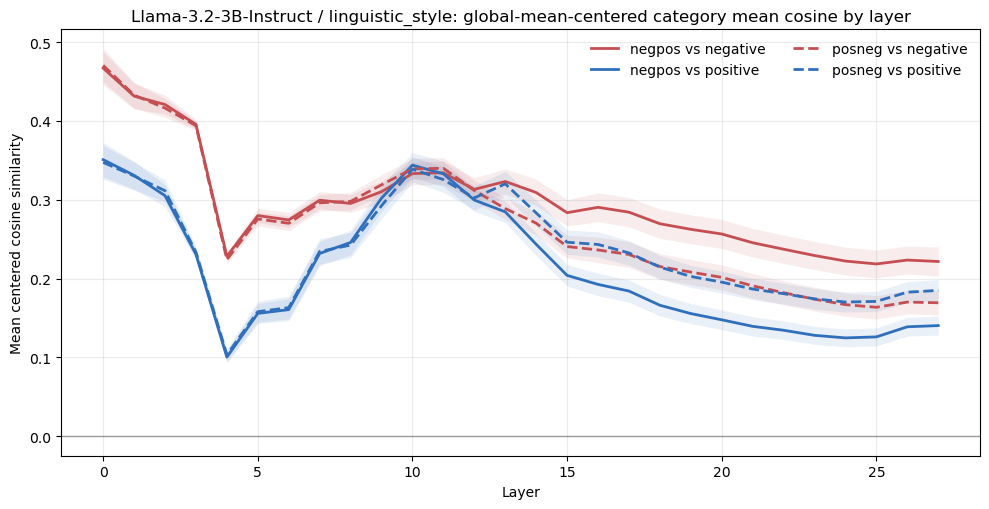

Saved: contrast_sanity_outputs/concatenate_cos/global_mean_centered_category_layer_trends/Llama-3.2-3B-Instruct_semantic_framing_global_mean_centered_category_layer_trends.png


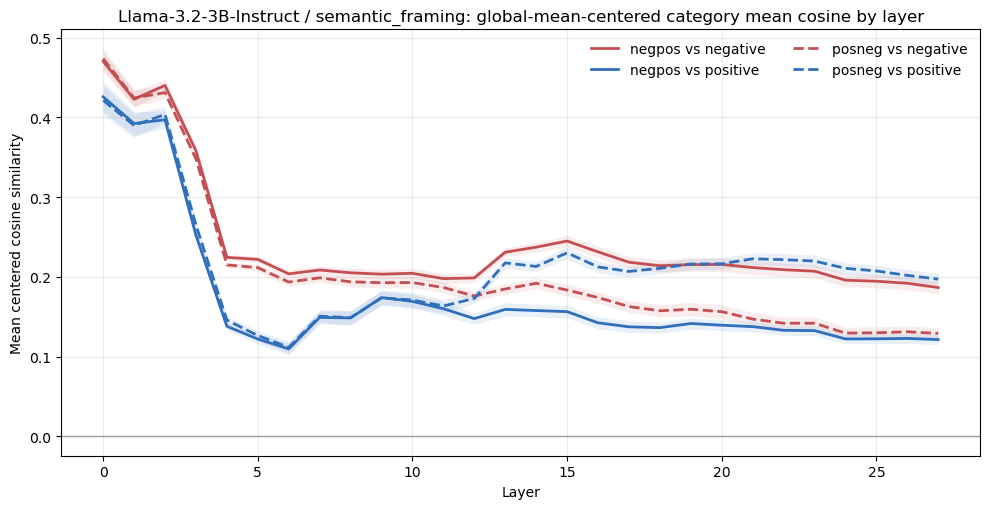

Saved: contrast_sanity_outputs/concatenate_cos/global_mean_centered_category_layer_trends/Qwen2.5-1.5B-Instruct_ideology_global_mean_centered_category_layer_trends.png


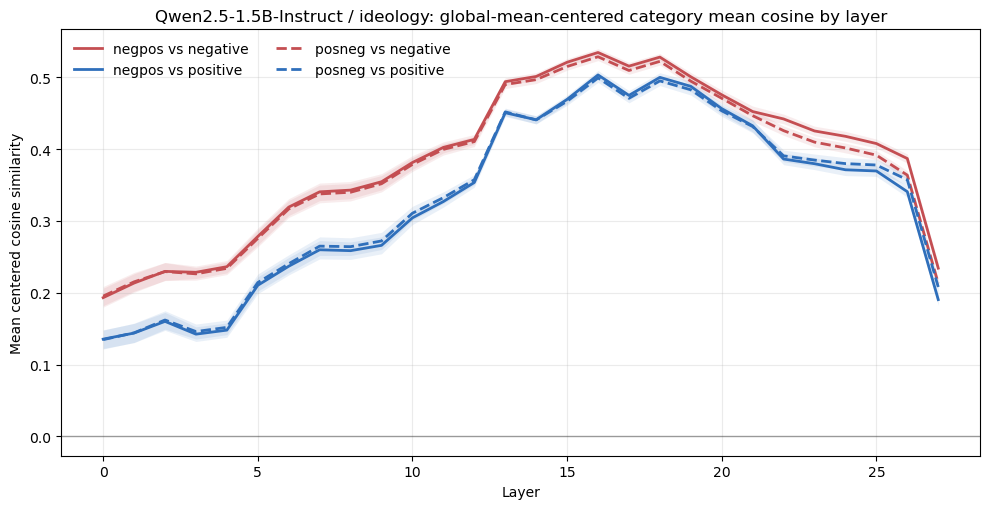

Saved: contrast_sanity_outputs/concatenate_cos/global_mean_centered_category_layer_trends/Qwen2.5-1.5B-Instruct_linguistic_style_global_mean_centered_category_layer_trends.png


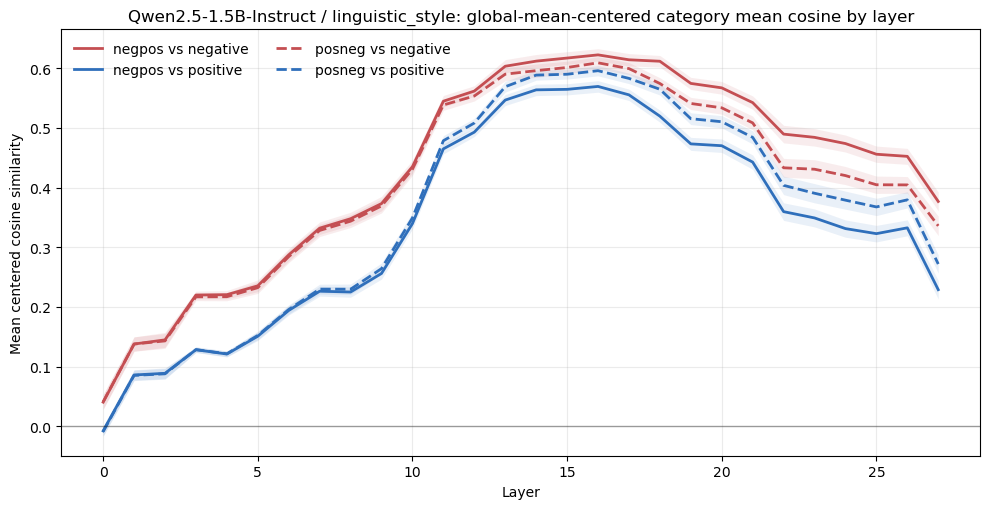

Saved: contrast_sanity_outputs/concatenate_cos/global_mean_centered_category_layer_trends/Qwen2.5-1.5B-Instruct_semantic_framing_global_mean_centered_category_layer_trends.png


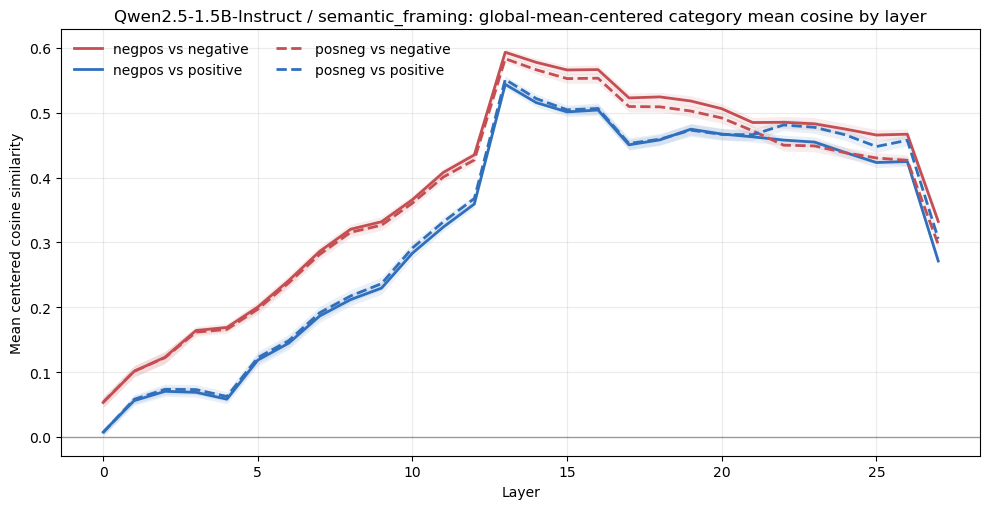

Saved: contrast_sanity_outputs/concatenate_cos/global_mean_centered_category_layer_trends/Qwen2.5-3B-Instruct_ideology_global_mean_centered_category_layer_trends.png


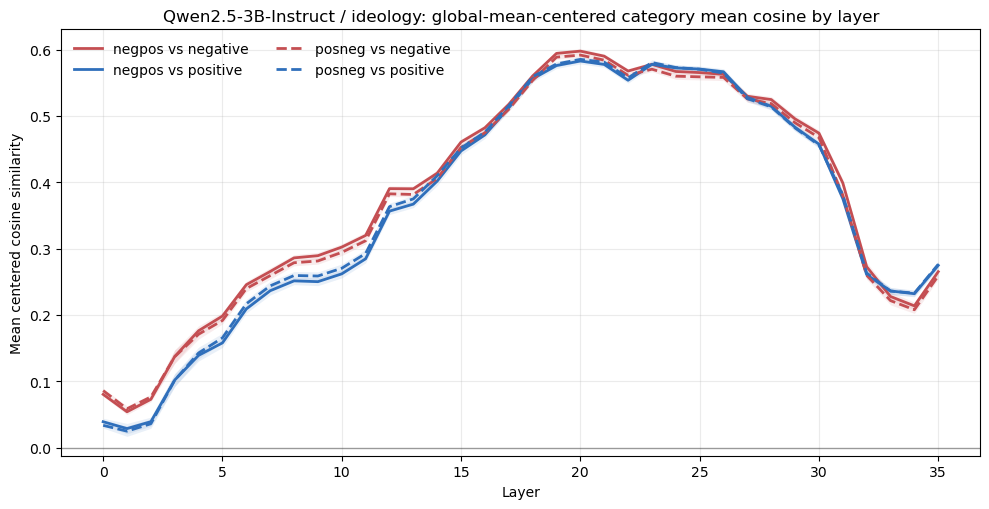

Saved: contrast_sanity_outputs/concatenate_cos/global_mean_centered_category_layer_trends/Qwen2.5-3B-Instruct_linguistic_style_global_mean_centered_category_layer_trends.png


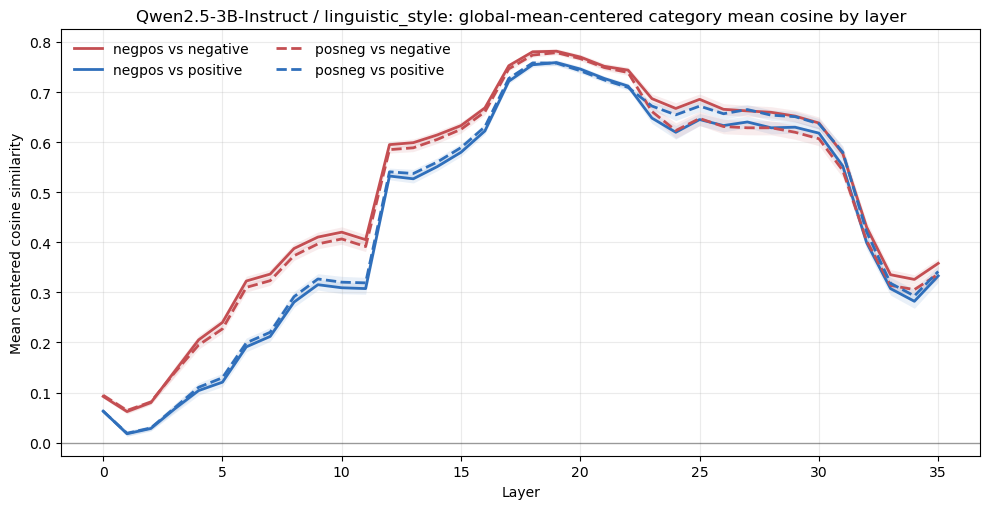

Saved: contrast_sanity_outputs/concatenate_cos/global_mean_centered_category_layer_trends/Qwen2.5-3B-Instruct_semantic_framing_global_mean_centered_category_layer_trends.png


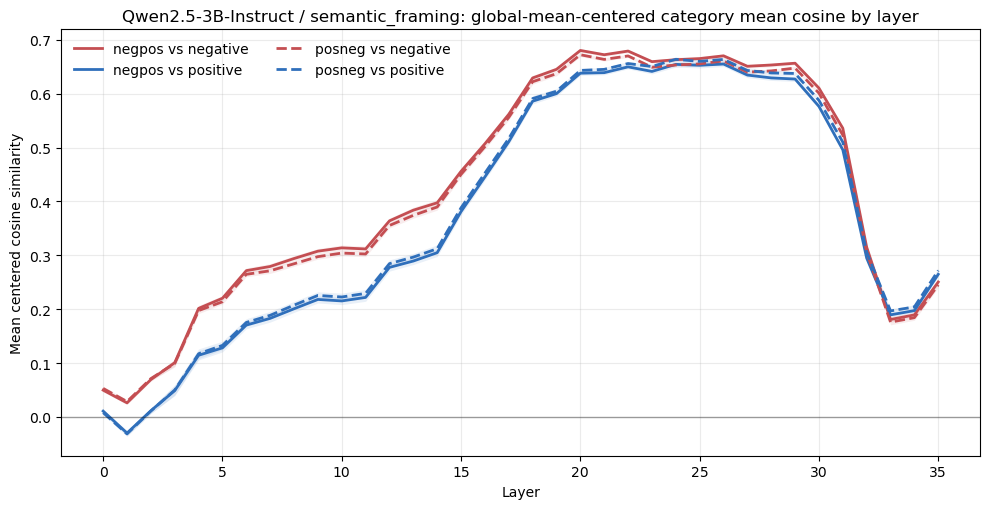

In [17]:
global_centered_category_layer_df = (
    global_centered_df
    .groupby(["model", "category", "concat_variant", "reference_variant", "layer"], as_index=False)
    .agg(
        mean_cos=("mean_cos", "mean"),
        std_across_pairs=("mean_cos", "std"),
        n_pairs=("pair_slug", "nunique"),
        n_rows_total=("n_rows", "sum"),
    )
)
global_centered_category_layer_df["sem_across_pairs"] = global_centered_category_layer_df["std_across_pairs"] / np.sqrt(
    global_centered_category_layer_df["n_pairs"].clip(lower=1)
)

global_centered_category_mean_df = (
    global_centered_df
    .groupby(["model", "category", "concat_variant", "reference_variant"], as_index=False)
    .agg(
        mean_cos=("mean_cos", "mean"),
        std_across_pair_layers=("mean_cos", "std"),
        n_pairs=("pair_slug", "nunique"),
        n_layers=("layer", "nunique"),
        n_rows_total=("n_rows", "sum"),
    )
)

global_centered_category_layer_path = OUTPUT_DIR / "global_mean_centered_category_layer_cosine_means.csv"
global_centered_category_mean_path = OUTPUT_DIR / "global_mean_centered_category_overall_cosine_means.csv"
global_centered_category_layer_df.to_csv(global_centered_category_layer_path, index=False)
global_centered_category_mean_df.to_csv(global_centered_category_mean_path, index=False)
print("Saved:", global_centered_category_layer_path)
print("Saved:", global_centered_category_mean_path)
display(global_centered_category_mean_df.head(12))

global_centered_category_plot_dir = OUTPUT_DIR / "global_mean_centered_category_layer_trends"
global_centered_category_plot_dir.mkdir(parents=True, exist_ok=True)

for (model_name, category), group in global_centered_category_layer_df.groupby(["model", "category"]):
    fig, ax = plt.subplots(figsize=(10, 5.2))
    for (concat_variant, reference_variant), line_df in group.groupby(["concat_variant", "reference_variant"]):
        line_df = line_df.sort_values("layer")
        style = STYLE[(concat_variant, reference_variant)]
        ax.plot(
            line_df["layer"],
            line_df["mean_cos"],
            color=style["color"],
            linestyle=style["linestyle"],
            linewidth=2,
            label=style["label"],
        )
        ax.fill_between(
            line_df["layer"].to_numpy(),
            (line_df["mean_cos"] - line_df["sem_across_pairs"]).to_numpy(),
            (line_df["mean_cos"] + line_df["sem_across_pairs"]).to_numpy(),
            color=style["color"],
            alpha=0.10,
            linewidth=0,
        )
    ax.axhline(0, color="black", linewidth=1, alpha=0.35)
    ax.set_title(f"{model_name} / {category}: global-mean-centered category mean cosine by layer")
    ax.set_xlabel("Layer")
    ax.set_ylabel("Mean centered cosine similarity")
    ax.grid(alpha=0.25)
    ax.legend(frameon=False, ncols=2)
    fig.tight_layout()
    out_path = global_centered_category_plot_dir / f"{model_name}_{category}_global_mean_centered_category_layer_trends.png"
    fig.savefig(out_path, dpi=180)
    print("Saved:", out_path)
    plt.show()


## Global-mean-centered pair-level layer trends within each category

Same 50-pair overlay plots as the raw analysis, but using global-mean-centered cosine similarities. Each `model + category` figure has four panels; each panel overlays all pair curves and a black category mean curve.


Saved: contrast_sanity_outputs/concatenate_cos/global_mean_centered_category_pair_layer_cosine_trends.csv


,model,category,pair_slug,concat_variant,reference_variant,layer,mean_cos,std_across_rows,n_rows_total
0,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,negative,0,0.501826,0.126742,100
1,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,negative,1,0.462712,0.119233,100
2,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,negative,2,0.450065,0.119768,100
3,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,negative,3,0.409229,0.109797,100
4,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,negative,4,0.249156,0.189765,100
5,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,negative,5,0.266523,0.225362,100
6,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,negative,6,0.232237,0.278878,100
7,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,negative,7,0.249523,0.302528,100
8,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,negative,8,0.252838,0.292599,100
9,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,negative,9,0.232448,0.309858,100


Saved: contrast_sanity_outputs/concatenate_cos/global_mean_centered_category_pair_layer_trends/Llama-3.2-3B-Instruct_ideology_global_mean_centered_pair_layer_trends.png


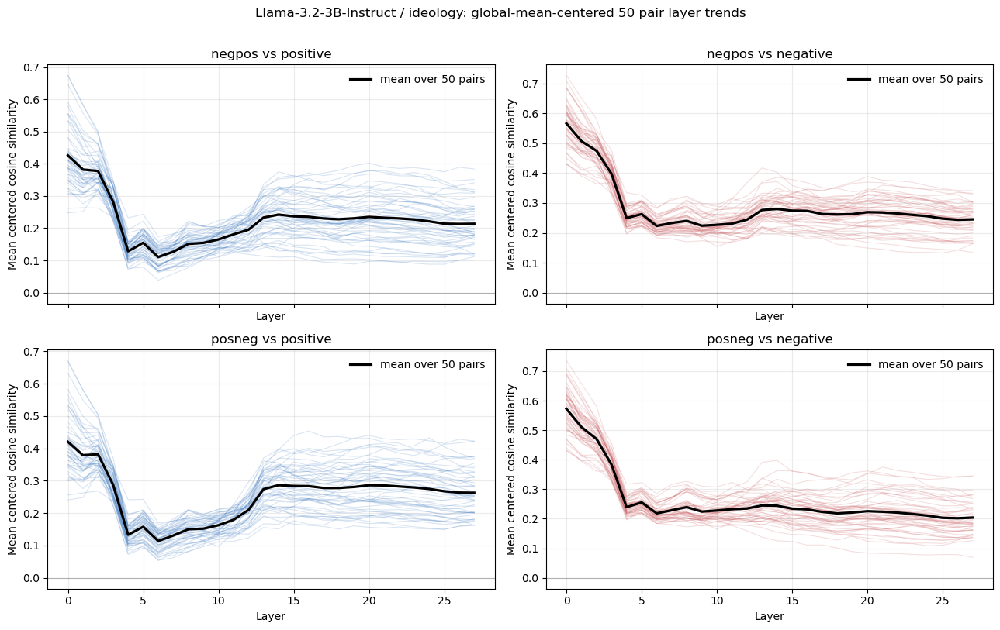

Saved: contrast_sanity_outputs/concatenate_cos/global_mean_centered_category_pair_layer_trends/Llama-3.2-3B-Instruct_linguistic_style_global_mean_centered_pair_layer_trends.png


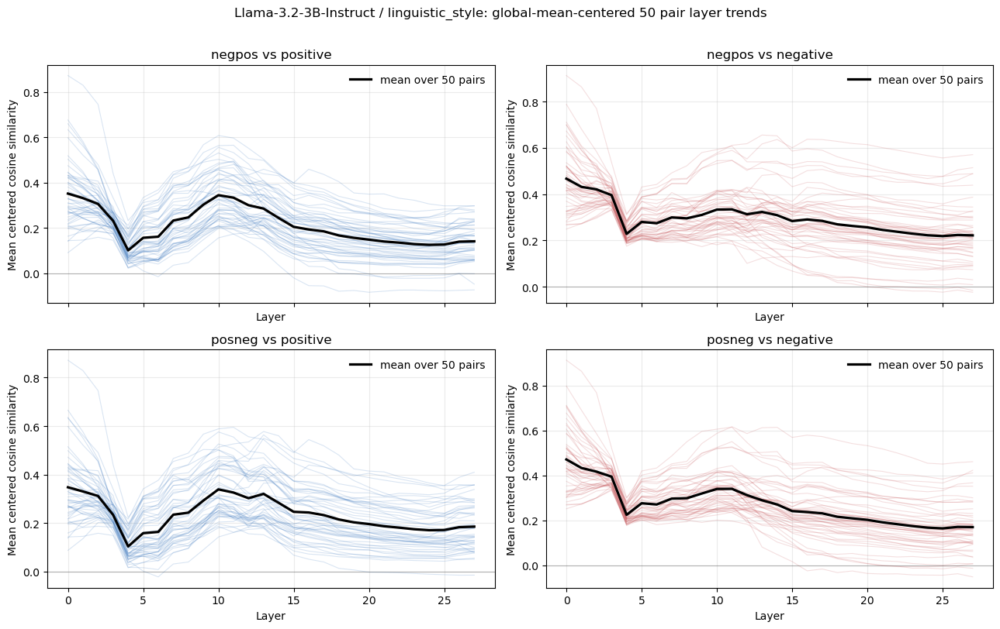

Saved: contrast_sanity_outputs/concatenate_cos/global_mean_centered_category_pair_layer_trends/Llama-3.2-3B-Instruct_semantic_framing_global_mean_centered_pair_layer_trends.png


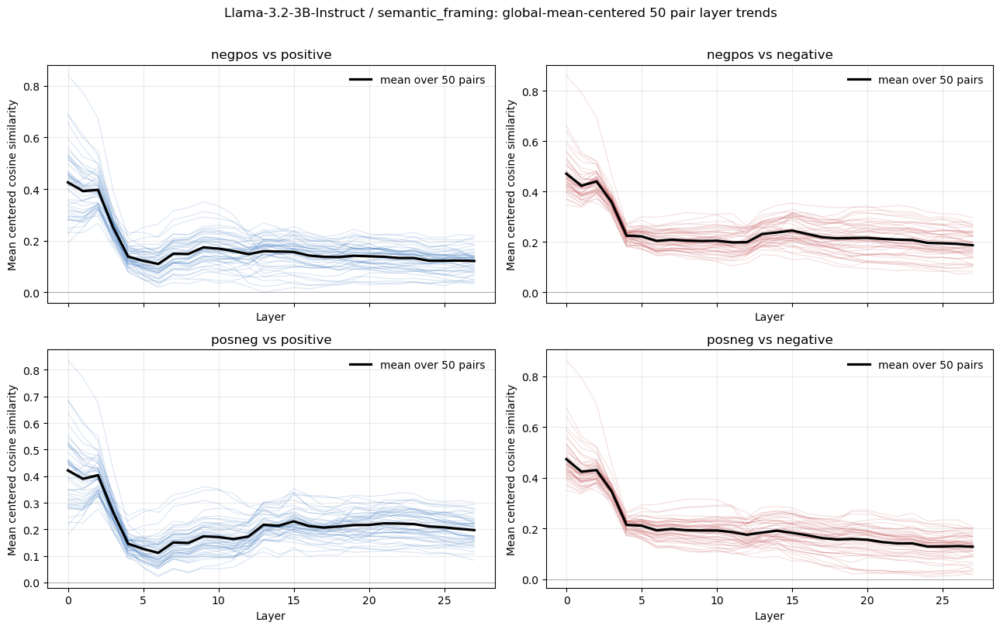

Saved: contrast_sanity_outputs/concatenate_cos/global_mean_centered_category_pair_layer_trends/Qwen2.5-1.5B-Instruct_ideology_global_mean_centered_pair_layer_trends.png


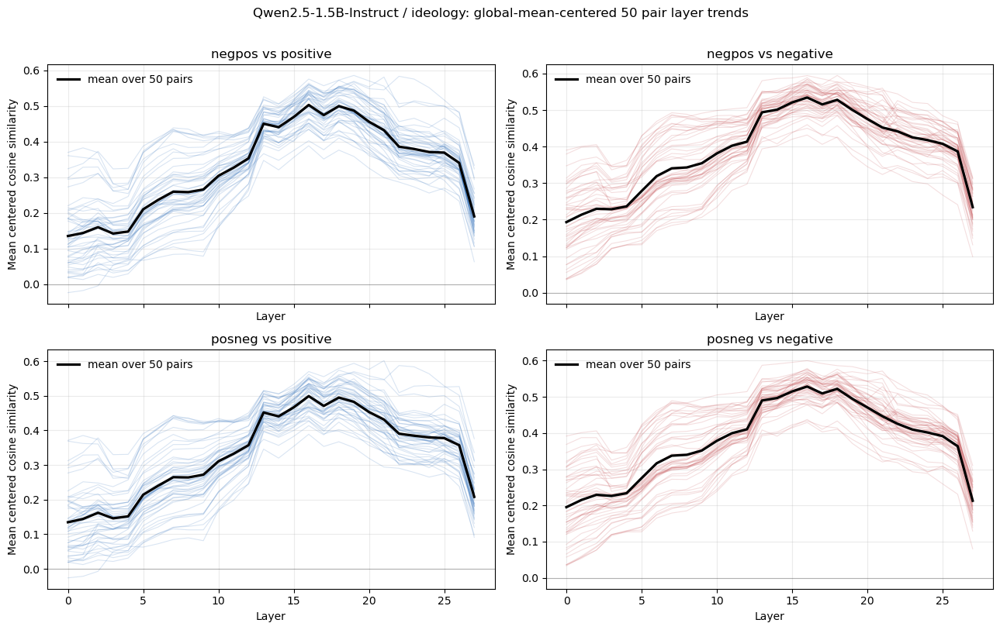

Saved: contrast_sanity_outputs/concatenate_cos/global_mean_centered_category_pair_layer_trends/Qwen2.5-1.5B-Instruct_linguistic_style_global_mean_centered_pair_layer_trends.png


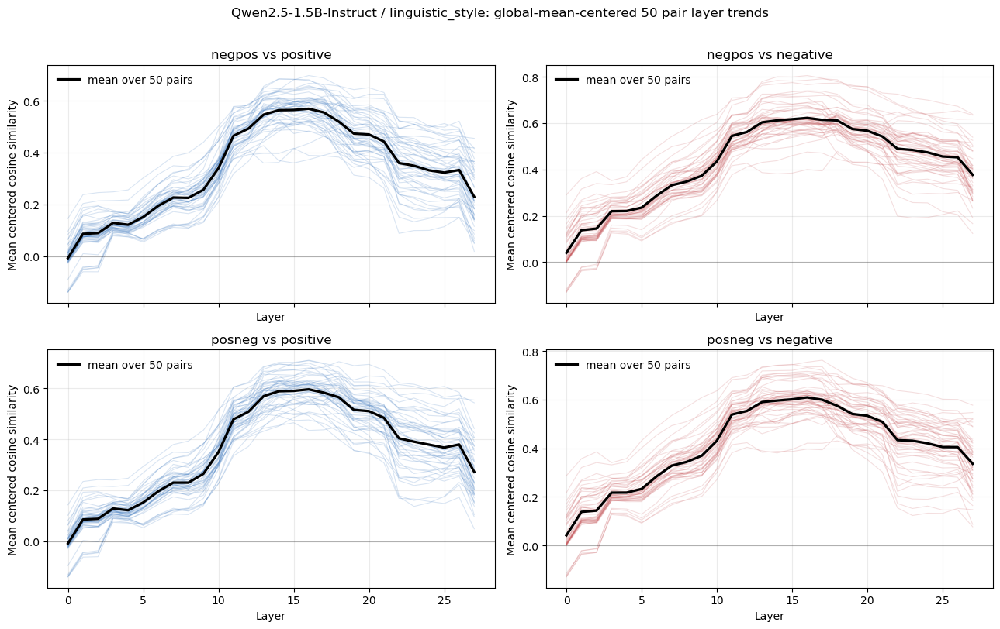

Saved: contrast_sanity_outputs/concatenate_cos/global_mean_centered_category_pair_layer_trends/Qwen2.5-1.5B-Instruct_semantic_framing_global_mean_centered_pair_layer_trends.png


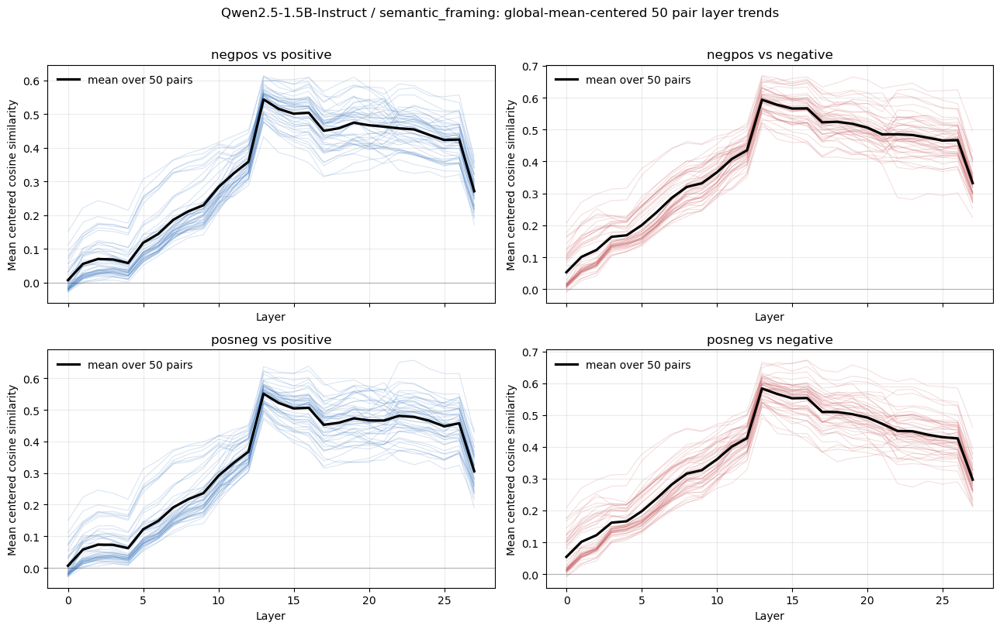

Saved: contrast_sanity_outputs/concatenate_cos/global_mean_centered_category_pair_layer_trends/Qwen2.5-3B-Instruct_ideology_global_mean_centered_pair_layer_trends.png


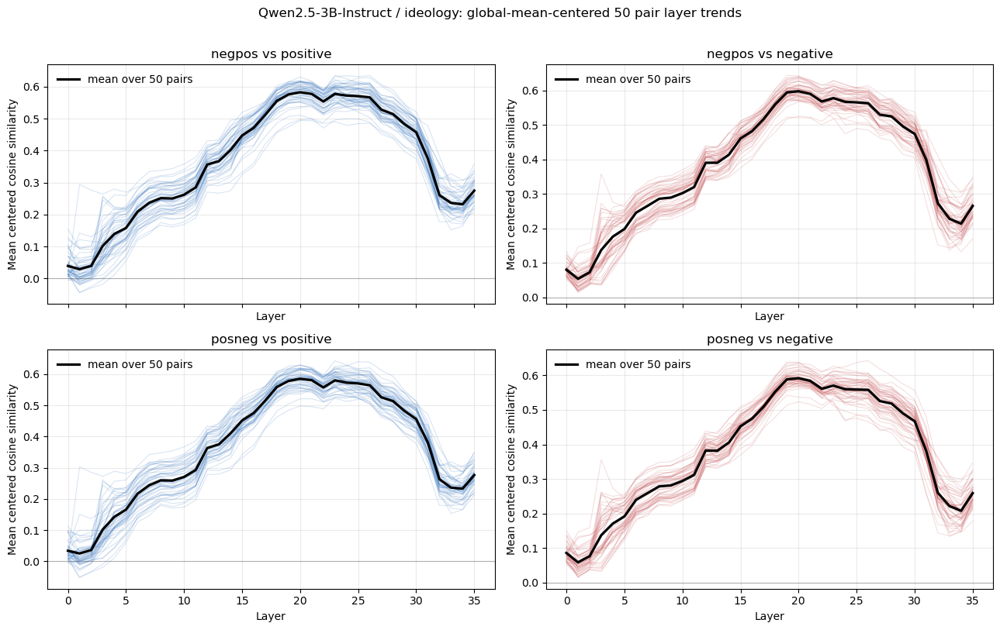

Saved: contrast_sanity_outputs/concatenate_cos/global_mean_centered_category_pair_layer_trends/Qwen2.5-3B-Instruct_linguistic_style_global_mean_centered_pair_layer_trends.png


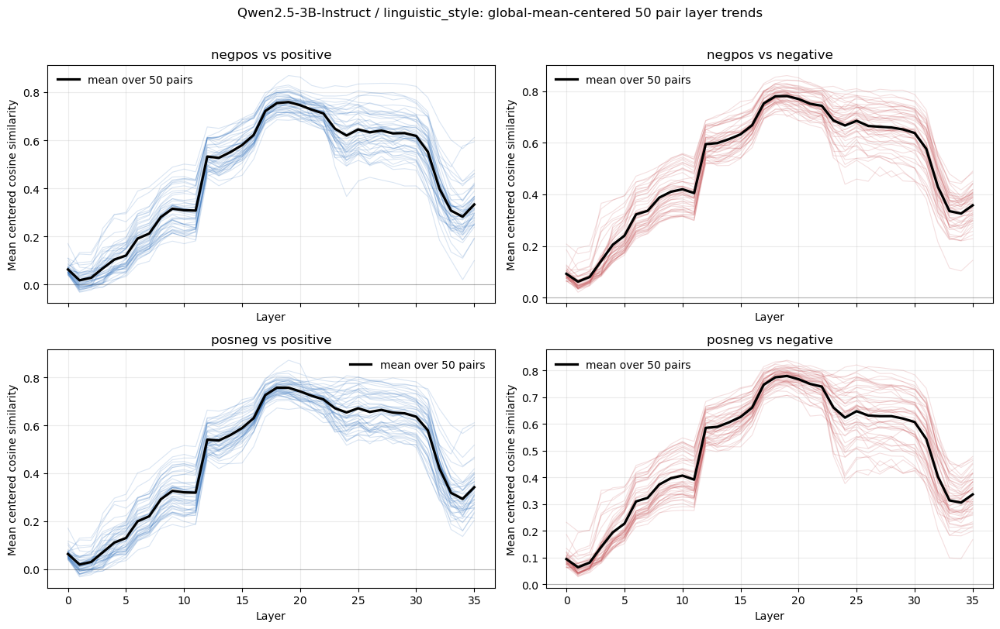

Saved: contrast_sanity_outputs/concatenate_cos/global_mean_centered_category_pair_layer_trends/Qwen2.5-3B-Instruct_semantic_framing_global_mean_centered_pair_layer_trends.png


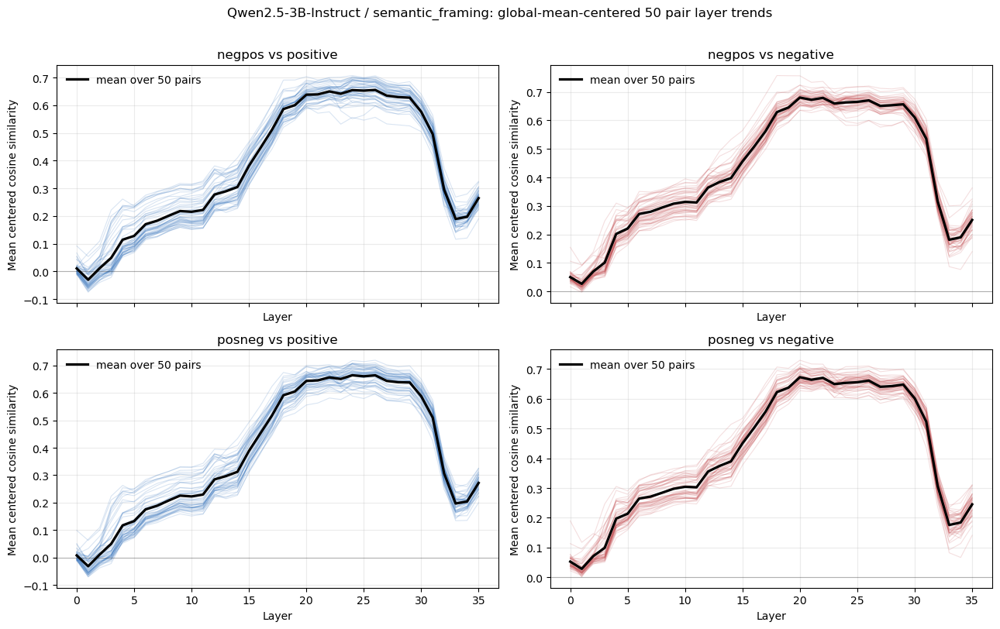

In [18]:
global_centered_pair_layer_df = (
    global_centered_df
    .groupby(["model", "category", "pair_slug", "concat_variant", "reference_variant", "layer"], as_index=False)
    .agg(
        mean_cos=("mean_cos", "mean"),
        std_across_rows=("std_cos", "mean"),
        n_rows_total=("n_rows", "sum"),
    )
)

global_centered_pair_layer_path = OUTPUT_DIR / "global_mean_centered_category_pair_layer_cosine_trends.csv"
global_centered_pair_layer_df.to_csv(global_centered_pair_layer_path, index=False)
print("Saved:", global_centered_pair_layer_path)
display(global_centered_pair_layer_df.head(12))

global_centered_pair_line_plot_dir = OUTPUT_DIR / "global_mean_centered_category_pair_layer_trends"
global_centered_pair_line_plot_dir.mkdir(parents=True, exist_ok=True)

GLOBAL_CENTERED_PANEL_ORDER = [
    ("negpos", "positive"),
    ("negpos", "negative"),
    ("posneg", "positive"),
    ("posneg", "negative"),
]

for (model_name, category), group in global_centered_pair_layer_df.groupby(["model", "category"]):
    pair_count = group["pair_slug"].nunique()
    fig, axes = plt.subplots(2, 2, figsize=(13, 8), sharex=True, sharey=False)
    axes = axes.ravel()

    for ax, condition in zip(axes, GLOBAL_CENTERED_PANEL_ORDER):
        concat_variant, reference_variant = condition
        condition_df = group[
            group["concat_variant"].eq(concat_variant)
            & group["reference_variant"].eq(reference_variant)
        ]
        style = STYLE[condition]

        for pair_slug, pair_df in condition_df.groupby("pair_slug"):
            pair_df = pair_df.sort_values("layer")
            ax.plot(
                pair_df["layer"],
                pair_df["mean_cos"],
                color=style["color"],
                alpha=0.18,
                linewidth=0.8,
            )

        mean_df = (
            condition_df
            .groupby("layer", as_index=False)
            .agg(mean_cos=("mean_cos", "mean"))
            .sort_values("layer")
        )
        ax.plot(
            mean_df["layer"],
            mean_df["mean_cos"],
            color="black",
            linewidth=2.3,
            label=f"mean over {pair_count} pairs",
        )
        ax.axhline(0, color="black", linewidth=0.8, alpha=0.25)
        ax.set_title(STYLE[condition]["label"])
        ax.set_xlabel("Layer")
        ax.set_ylabel("Mean centered cosine similarity")
        ax.grid(alpha=0.25)
        ax.legend(frameon=False)

    fig.suptitle(f"{model_name} / {category}: global-mean-centered 50 pair layer trends", y=1.01)
    fig.tight_layout()
    out_path = global_centered_pair_line_plot_dir / f"{model_name}_{category}_global_mean_centered_pair_layer_trends.png"
    fig.savefig(out_path, dpi=180, bbox_inches="tight")
    print("Saved:", out_path)
    plt.show()


## Single pair and statement layer trends

Set one `model`, `category`, `pair_slug`, and `statement_index` to plot the four concat-vs-pos/neg layer trends for exactly that one statement row. This reads the selected row directly from the `.npy` files, so it is not averaged over the 100 statements.


Saved: contrast_sanity_outputs/concatenate_cos/single_pair_statement_tables/Qwen2.5-3B-Instruct_semantic_framing_semantic_framing__performance_perspective__safety_perspective_statement_0_global_mean_centered.csv


,model,category,pair_slug,statement_index,centered,concat_variant,reference_variant,layer,cosine
0,Qwen2.5-3B-Instruct,semantic_framing,semantic_framing__performance_perspective__saf...,0,True,negpos,positive,0,-0.045293
1,Qwen2.5-3B-Instruct,semantic_framing,semantic_framing__performance_perspective__saf...,0,True,negpos,negative,0,-0.108786
2,Qwen2.5-3B-Instruct,semantic_framing,semantic_framing__performance_perspective__saf...,0,True,posneg,positive,0,-0.049860
3,Qwen2.5-3B-Instruct,semantic_framing,semantic_framing__performance_perspective__saf...,0,True,posneg,negative,0,-0.109034
4,Qwen2.5-3B-Instruct,semantic_framing,semantic_framing__performance_perspective__saf...,0,True,negpos,positive,1,-0.187494
5,Qwen2.5-3B-Instruct,semantic_framing,semantic_framing__performance_perspective__saf...,0,True,negpos,negative,1,-0.180495
6,Qwen2.5-3B-Instruct,semantic_framing,semantic_framing__performance_perspective__saf...,0,True,posneg,positive,1,-0.205562
7,Qwen2.5-3B-Instruct,semantic_framing,semantic_framing__performance_perspective__saf...,0,True,posneg,negative,1,-0.190254
8,Qwen2.5-3B-Instruct,semantic_framing,semantic_framing__performance_perspective__saf...,0,True,negpos,positive,2,-0.127040
9,Qwen2.5-3B-Instruct,semantic_framing,semantic_framing__performance_perspective__saf...,0,True,negpos,negative,2,-0.110880


Saved: contrast_sanity_outputs/concatenate_cos/single_pair_statement_global_mean_centered/Qwen2.5-3B-Instruct_semantic_framing_semantic_framing__performance_perspective__safety_perspective_statement_0_global-mean-centered_trends.png


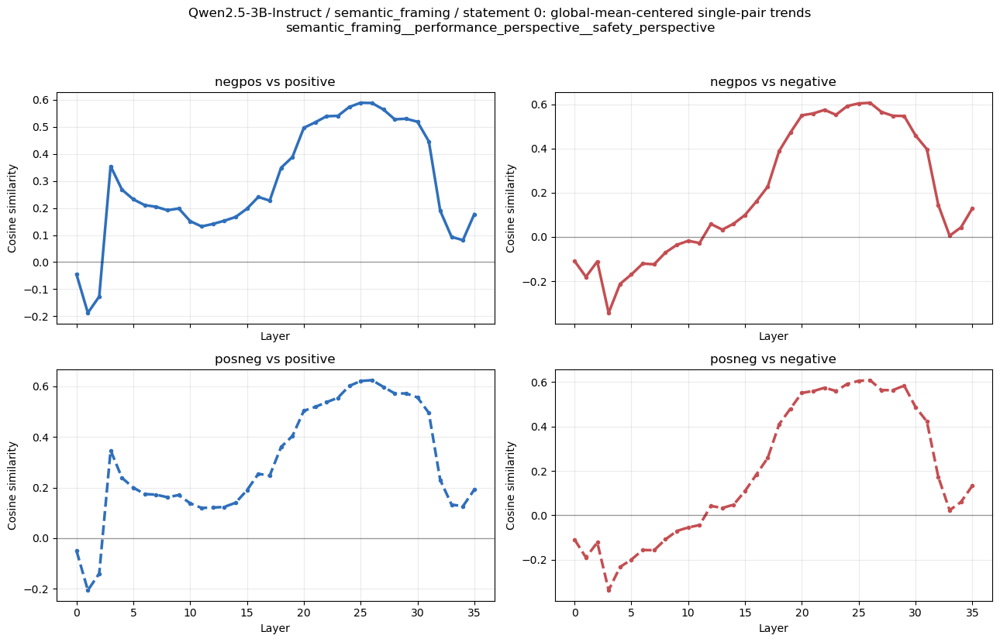

PosixPath('contrast_sanity_outputs/concatenate_cos/single_pair_statement_global_mean_centered/Qwen2.5-3B-Instruct_semantic_framing_semantic_framing__performance_perspective__safety_perspective_statement_0_global-mean-centered_trends.png')

In [19]:
# Edit these four values.
SINGLE_MODEL = "Qwen2.5-3B-Instruct"
SINGLE_CATEGORY = "semantic_framing"
SINGLE_PAIR_SLUG = "semantic_framing__performance_perspective__safety_perspective"
SINGLE_STATEMENT_INDEX = 0  # 0-based row index inside each layer_*.npy file
SINGLE_USE_GLOBAL_MEAN = True


def cosine_one_vector(a: np.ndarray, b: np.ndarray, eps: float = 1e-12) -> float:
    a = np.asarray(a, dtype=np.float64)
    b = np.asarray(b, dtype=np.float64)
    denom = np.linalg.norm(a) * np.linalg.norm(b)
    return float(np.dot(a, b) / max(denom, eps))


def available_layers_for_single_selection(
    model_name: str,
    category: str,
    pair_slug: str,
) -> list[int]:
    layer_sets = []
    for concat_variant in CONCAT_VARIANTS:
        layer_sets.append(
            set(valid_layer_files(CONCAT_HIDDEN_ROOT / model_name / category / pair_slug / concat_variant))
        )
    for reference_variant in REFERENCE_VARIANTS:
        layer_sets.append(
            set(valid_layer_files(BASE_HIDDEN_ROOT / model_name / category / pair_slug / reference_variant))
        )
    common_layers = set.intersection(*layer_sets)
    return sorted(common_layers)


def load_single_hidden_row(path: Path, statement_index: int) -> np.ndarray:
    arr = np.load(path, mmap_mode="r")
    if arr.ndim == 1:
        if statement_index != 0:
            raise IndexError(f"{path} has one row, but statement_index={statement_index}")
        return np.asarray(arr, dtype=np.float64)
    if statement_index < 0 or statement_index >= arr.shape[0]:
        raise IndexError(f"statement_index={statement_index} out of range for {path}; shape={arr.shape}")
    return np.asarray(arr[statement_index], dtype=np.float64)


def load_or_compute_single_global_means(model_name: str, layers: list[int]) -> dict[int, np.ndarray]:
    model_mean_dir = GLOBAL_MEAN_DIR / model_name
    means = {}
    missing_layers = []
    for layer in layers:
        mean_path = model_mean_dir / f"layer_{layer}.npy"
        if mean_path.exists():
            means[layer] = np.load(mean_path)
        else:
            missing_layers.append(layer)
    if missing_layers:
        print(f"Missing cached global means for {model_name} layers {missing_layers}; recomputing model means.")
        all_means = compute_global_means_for_model(model_name)
        means = {layer: all_means[layer] for layer in layers}
    return means


def compute_single_pair_statement_cosines(
    model_name: str,
    category: str,
    pair_slug: str,
    statement_index: int,
    use_global_mean: bool = True,
) -> pd.DataFrame:
    layers = available_layers_for_single_selection(model_name, category, pair_slug)
    if not layers:
        raise RuntimeError(f"No common layers found for {model_name} / {category} / {pair_slug}")

    global_means = load_or_compute_single_global_means(model_name, layers) if use_global_mean else {}
    rows = []
    for layer in layers:
        mean_vec = global_means.get(layer)
        for concat_variant in CONCAT_VARIANTS:
            concat_path = layer_file_for(CONCAT_HIDDEN_ROOT, model_name, category, pair_slug, concat_variant, layer)
            concat_vec = load_single_hidden_row(concat_path, statement_index)
            if use_global_mean:
                concat_vec = concat_vec - mean_vec
            for reference_variant in REFERENCE_VARIANTS:
                reference_path = layer_file_for(BASE_HIDDEN_ROOT, model_name, category, pair_slug, reference_variant, layer)
                reference_vec = load_single_hidden_row(reference_path, statement_index)
                if use_global_mean:
                    reference_vec = reference_vec - mean_vec
                rows.append({
                    "model": model_name,
                    "category": category,
                    "pair_slug": pair_slug,
                    "statement_index": statement_index,
                    "centered": use_global_mean,
                    "concat_variant": concat_variant,
                    "reference_variant": reference_variant,
                    "layer": layer,
                    "cosine": cosine_one_vector(concat_vec, reference_vec),
                })
    return pd.DataFrame(rows)


def plot_single_pair_statement_cosines(single_df: pd.DataFrame, output_dir: Path = OUTPUT_DIR) -> Path:
    if single_df.empty:
        raise RuntimeError("single_df is empty")
    first = single_df.iloc[0]
    model_name = first["model"]
    category = first["category"]
    pair_slug = first["pair_slug"]
    statement_index = int(first["statement_index"])
    centered = bool(first["centered"])
    title_prefix = "global-mean-centered" if centered else "raw"

    fig, axes = plt.subplots(2, 2, figsize=(13, 8), sharex=True, sharey=False)
    axes = axes.ravel()
    for ax, condition in zip(axes, PANEL_ORDER):
        concat_variant, reference_variant = condition
        condition_df = single_df[
            single_df["concat_variant"].eq(concat_variant)
            & single_df["reference_variant"].eq(reference_variant)
        ].sort_values("layer")
        style = STYLE[condition]
        ax.plot(
            condition_df["layer"],
            condition_df["cosine"],
            color=style["color"],
            linestyle=style["linestyle"],
            linewidth=2.5,
            marker="o",
            markersize=3,
        )
        ax.axhline(0, color="black", linewidth=1, alpha=0.35)
        ax.set_title(style["label"])
        ax.set_xlabel("Layer")
        ax.set_ylabel("Cosine similarity")
        ax.grid(alpha=0.25)

    fig.suptitle(
        f"{model_name} / {category} / statement {statement_index}: {title_prefix} single-pair trends\n{pair_slug}",
        y=1.03,
    )
    fig.tight_layout()

    single_plot_dir = output_dir / ("single_pair_statement_global_mean_centered" if centered else "single_pair_statement_raw")
    single_plot_dir.mkdir(parents=True, exist_ok=True)
    out_path = single_plot_dir / f"{model_name}_{category}_{pair_slug}_statement_{statement_index}_{title_prefix}_trends.png"
    fig.savefig(out_path, dpi=180, bbox_inches="tight")
    print("Saved:", out_path)
    plt.show()
    return out_path


single_pair_statement_df = compute_single_pair_statement_cosines(
    model_name=SINGLE_MODEL,
    category=SINGLE_CATEGORY,
    pair_slug=SINGLE_PAIR_SLUG,
    statement_index=SINGLE_STATEMENT_INDEX,
    use_global_mean=SINGLE_USE_GLOBAL_MEAN,
)

single_csv_dir = OUTPUT_DIR / "single_pair_statement_tables"
single_csv_dir.mkdir(parents=True, exist_ok=True)
single_csv_path = single_csv_dir / (
    f"{SINGLE_MODEL}_{SINGLE_CATEGORY}_{SINGLE_PAIR_SLUG}_statement_{SINGLE_STATEMENT_INDEX}_"
    f"{'global_mean_centered' if SINGLE_USE_GLOBAL_MEAN else 'raw'}.csv"
)
single_pair_statement_df.to_csv(single_csv_path, index=False)
print("Saved:", single_csv_path)
display(single_pair_statement_df.head(12))
plot_single_pair_statement_cosines(single_pair_statement_df)


Saved: contrast_sanity_outputs/concatenate_cos/single_pair_statement_tables/Llama-3.2-3B-Instruct_semantic_framing_semantic_framing__performance_perspective__safety_perspective_statement_0_global_mean_centered.csv


,model,category,pair_slug,statement_index,centered,concat_variant,reference_variant,layer,cosine
0,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__neutral_register__colloquial...,74,True,negpos,positive,0,0.267993
1,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__neutral_register__colloquial...,74,True,negpos,negative,0,0.559656
2,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__neutral_register__colloquial...,74,True,posneg,positive,0,0.276705
3,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__neutral_register__colloquial...,74,True,posneg,negative,0,0.562053
4,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__neutral_register__colloquial...,74,True,negpos,positive,1,0.261528
5,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__neutral_register__colloquial...,74,True,negpos,negative,1,0.492739
6,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__neutral_register__colloquial...,74,True,posneg,positive,1,0.273521
7,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__neutral_register__colloquial...,74,True,posneg,negative,1,0.493099
8,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__neutral_register__colloquial...,74,True,negpos,positive,2,0.314741
9,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__neutral_register__colloquial...,74,True,negpos,negative,2,0.553922


Saved: contrast_sanity_outputs/concatenate_cos/single_pair_statement_global_mean_centered/Llama-3.2-3B-Instruct_linguistic_style_linguistic_style__neutral_register__colloquial_register_statement_74_global-mean-centered_trends.png


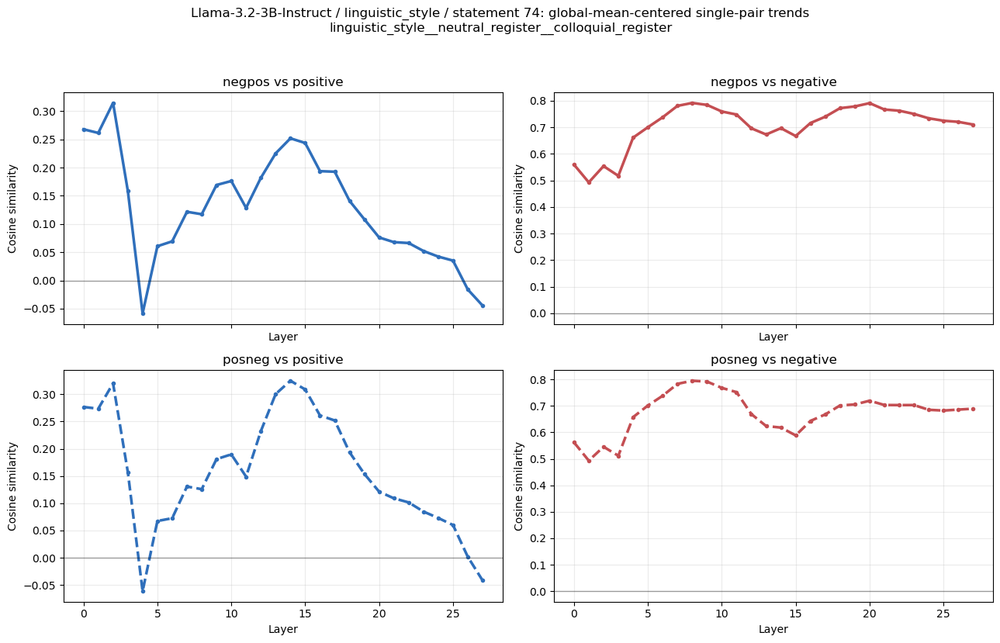

PosixPath('contrast_sanity_outputs/concatenate_cos/single_pair_statement_global_mean_centered/Llama-3.2-3B-Instruct_linguistic_style_linguistic_style__neutral_register__colloquial_register_statement_74_global-mean-centered_trends.png')

In [29]:
single_pair_statement_df = compute_single_pair_statement_cosines(
    model_name="Llama-3.2-3B-Instruct",
    category="linguistic_style",
    pair_slug="linguistic_style__neutral_register__colloquial_register",
    statement_index=74,
    use_global_mean=SINGLE_USE_GLOBAL_MEAN,
)

single_csv_dir = OUTPUT_DIR / "single_pair_statement_tables"
single_csv_dir.mkdir(parents=True, exist_ok=True)
single_csv_path = single_csv_dir / (
    f"{"Llama-3.2-3B-Instruct"}_{SINGLE_CATEGORY}_{SINGLE_PAIR_SLUG}_statement_{SINGLE_STATEMENT_INDEX}_"
    f"{'global_mean_centered' if SINGLE_USE_GLOBAL_MEAN else 'raw'}.csv"
)
single_pair_statement_df.to_csv(single_csv_path, index=False)
print("Saved:", single_csv_path)
display(single_pair_statement_df.head(12))
plot_single_pair_statement_cosines(single_pair_statement_df)

{"judge_model": "google/gemma-3-4b-it", "generation_file": "outputs/generations_llama32_negpos_full/Llama-3.2-3B-Instruct/linguistic_style/linguistic_style__neutral_register__colloquial_register/negpos/generations.jsonl", "combined_order": "negpos", "first_concept": "colloquial register", "second_concept": "neutral register", "success": 0, "score": 0, "judgement": "Success: 0\nExplanation: The response primarily employs a colloquial register, failing to adequately address the requested neutral register as a distinct perspective.", "category_name": "LINGUISTIC STYLE", "category_key": "linguistic_style", "pair_slug": "linguistic_style__neutral_register__colloquial_register", "positive_concept": "neutral register", "negative_concept": "colloquial register", "statement_index": 74, "statement_source": "class_1.txt", "statement": "Healing isn’t linear.", "variant": "negpos", "generated_text": "You know, I think that's pretty much a no-brainer. Healing's not some straightforward, step-by-step process where you do this one thing and suddenly you're all better. It's more like a journey, ya know? You gotta navigate through ups and downs, twists and turns. Some days are gonna be way easier than others, and that's just part of it. There's no set timeline or formula for healing - it's all about taking it one day at a time and being patient with yourself."}

{"judge_model": "google/gemma-3-4b-it", "generation_file": "outputs/generations_llama32_posneg_full/Llama-3.2-3B-Instruct/linguistic_style/linguistic_style__neutral_register__colloquial_register/posneg/generations.jsonl", "combined_order": "posneg", "first_concept": "neutral register", "second_concept": "colloquial register", "success": 0, "score": 0, "judgement": "Success: 0\nExplanation: The response primarily uses a colloquial register but fails to substantively address the neutral register, presenting a descriptive explanation rather than a detached observation.", "category_name": "LINGUISTIC STYLE", "category_key": "linguistic_style", "pair_slug": "linguistic_style__neutral_register__colloquial_register", "positive_concept": "neutral register", "negative_concept": "colloquial register", "statement_index": 74, "statement_source": "class_1.txt", "statement": "Healing isn’t linear.", "variant": "posneg", "generated_text": "You know, I think that's a pretty accurate take. Healing isn't always a straightforward process. It's like, you'd think it would be all sunshine and rainbows, but sometimes it's more like a messy, winding road with ups and downs. People might experience setbacks, or they might bounce back faster than expected. And sometimes, it can feel like you're taking two steps forward and one step back. It's not always easy to predict, and that's what makes it so complicated."}

Saved: contrast_sanity_outputs/concatenate_cos/single_pair_statement_tables/Llama-3.2-3B-Instruct_semantic_framing_semantic_framing__performance_perspective__safety_perspective_statement_0_global_mean_centered.csv


,model,category,pair_slug,statement_index,centered,concat_variant,reference_variant,layer,cosine
0,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__simple_wording__sophisticate...,0,True,negpos,positive,0,0.284583
1,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__simple_wording__sophisticate...,0,True,negpos,negative,0,0.294630
2,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__simple_wording__sophisticate...,0,True,posneg,positive,0,0.282413
3,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__simple_wording__sophisticate...,0,True,posneg,negative,0,0.285828
4,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__simple_wording__sophisticate...,0,True,negpos,positive,1,0.250821
5,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__simple_wording__sophisticate...,0,True,negpos,negative,1,0.313715
6,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__simple_wording__sophisticate...,0,True,posneg,positive,1,0.259334
7,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__simple_wording__sophisticate...,0,True,posneg,negative,1,0.312453
8,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__simple_wording__sophisticate...,0,True,negpos,positive,2,0.248048
9,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__simple_wording__sophisticate...,0,True,negpos,negative,2,0.385004


Saved: contrast_sanity_outputs/concatenate_cos/single_pair_statement_global_mean_centered/Llama-3.2-3B-Instruct_linguistic_style_linguistic_style__simple_wording__sophisticated_wording_statement_0_global-mean-centered_trends.png


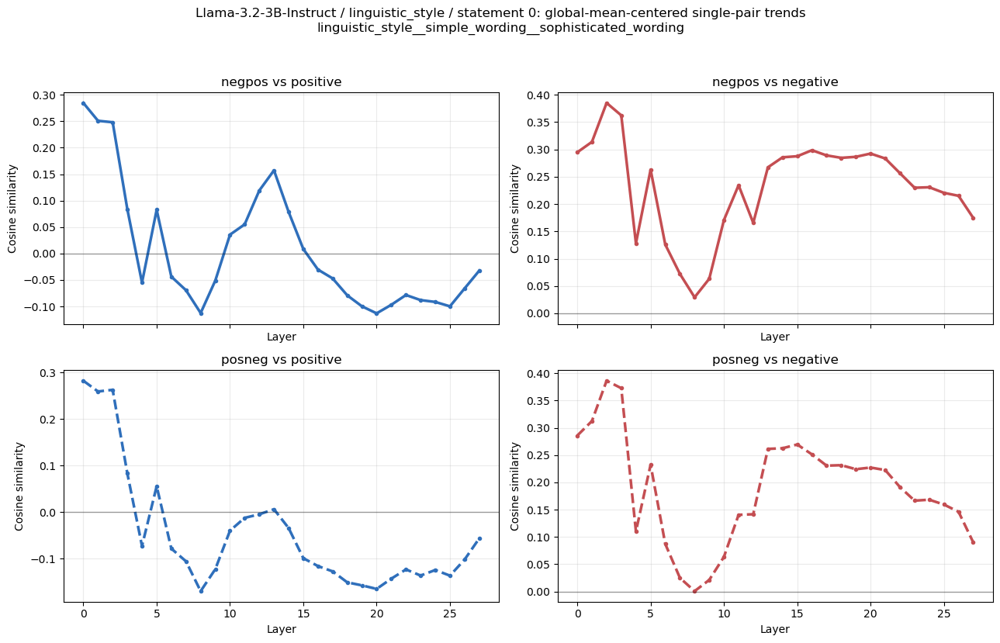

PosixPath('contrast_sanity_outputs/concatenate_cos/single_pair_statement_global_mean_centered/Llama-3.2-3B-Instruct_linguistic_style_linguistic_style__simple_wording__sophisticated_wording_statement_0_global-mean-centered_trends.png')

In [30]:
single_pair_statement_df = compute_single_pair_statement_cosines(
    model_name="Llama-3.2-3B-Instruct",
    category="linguistic_style",
    pair_slug="linguistic_style__simple_wording__sophisticated_wording",
    statement_index=0,
    use_global_mean=SINGLE_USE_GLOBAL_MEAN,
)

single_csv_dir = OUTPUT_DIR / "single_pair_statement_tables"
single_csv_dir.mkdir(parents=True, exist_ok=True)
single_csv_path = single_csv_dir / (
    f"{"Llama-3.2-3B-Instruct"}_{SINGLE_CATEGORY}_{SINGLE_PAIR_SLUG}_statement_{SINGLE_STATEMENT_INDEX}_"
    f"{'global_mean_centered' if SINGLE_USE_GLOBAL_MEAN else 'raw'}.csv"
)
single_pair_statement_df.to_csv(single_csv_path, index=False)
print("Saved:", single_csv_path)
display(single_pair_statement_df.head(12))
plot_single_pair_statement_cosines(single_pair_statement_df)

{"judge_model": "google/gemma-3-4b-it", "generation_file": "outputs/generations_llama32_negpos_full/Llama-3.2-3B-Instruct/linguistic_style/linguistic_style__simple_wording__sophisticated_wording/negpos/generations.jsonl", "combined_order": "negpos", "first_concept": "sophisticated wording", "second_concept": "simple wording", "success": 0, "score": 0, "judgement": "Success: 0\nExplanation: The response focuses solely on sophisticated wording and does not address the requested simple wording as a distinct perspective.", "category_name": "LINGUISTIC STYLE", "category_key": "linguistic_style", "pair_slug": "linguistic_style__simple_wording__sophisticated_wording", "positive_concept": "simple wording", "negative_concept": "sophisticated wording", "statement_index": 0, "statement_source": "class_1.txt", "statement": "Your future self is watching your choices today.", "variant": "negpos", "generated_text": "The assertion that \"your future self is watching your choices today\" is a notion that warrants contemplation, as it posits an intriguing dynamic where one's future self serves as an unseen, omniscient observer, scrutinizing the decisions made in the present. On one hand, this perspective can be seen as a powerful motivator, as it instills a sense of accountability and encourages individuals to make more informed, deliberate choices. The weight of knowing that one's future self is witnessing their actions can catalyze a sense of responsibility, fostering a more mindful approach to decision-making.\n\nOn the other hand, this concept can also be perceived as an existential anxiety-inducing phenomenon, where individuals may feel an overwhelming pressure to constantly evaluate and justify their choices, potentially leading to indecision or an excessive preoccupation with the potential consequences of their actions. Furthermore, the notion of a future self watching one's choices raises questions about the nature of free will and whether our decisions are truly under our control.\n\nUltimately, the idea that \"your future self is watching your choices today\" presents a complex interplay between motivation and introspection, encouraging individuals to engage in self-reflection and consider the long-term implications of their decisions. While it may not be a comforting thought for everyone, it can serve as a catalyst for personal growth and self-awareness, helping individuals to cultivate a more thoughtful and intentional approach to life."}

{"judge_model": "google/gemma-3-4b-it", "generation_file": "outputs/generations_llama32_posneg_full/Llama-3.2-3B-Instruct/linguistic_style/linguistic_style__simple_wording__sophisticated_wording/posneg/generations.jsonl", "combined_order": "posneg", "first_concept": "simple wording", "second_concept": "sophisticated wording", "success": 1, "score": 1, "judgement": "Success: 1\nExplanation: The response clearly addresses both simple and sophisticated wording styles, using distinct language and explanations to discuss the original statement.", "category_name": "LINGUISTIC STYLE", "category_key": "linguistic_style", "pair_slug": "linguistic_style__simple_wording__sophisticated_wording", "positive_concept": "simple wording", "negative_concept": "sophisticated wording", "statement_index": 0, "statement_source": "class_1.txt", "statement": "Your future self is watching your choices today.", "variant": "posneg", "generated_text": "**Simple Wording:**\nI think that's a pretty cool idea. It means that every decision you make now can affect who you'll be in the future. It's like, if you make good choices, you'll be happy and successful, and if you make bad choices, you'll regret it later.\n\n**Sophisticated Wording:**\nThe notion that one's future self is scrutinizing their present-day decisions is a thought-provoking concept that underscores the profound impact of our choices on our lives. This introspective perspective suggests that the cumulative effects of our decisions will ultimately determine the person we become, fostering a sense of accountability and responsibility for our actions."}

Saved: contrast_sanity_outputs/concatenate_cos/single_pair_statement_tables/Llama-3.2-3B-Instruct_semantic_framing_semantic_framing__performance_perspective__safety_perspective_statement_0_global_mean_centered.csv


,model,category,pair_slug,statement_index,centered,concat_variant,reference_variant,layer,cosine
0,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__specific_wording__general_wo...,54,True,negpos,positive,0,0.145334
1,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__specific_wording__general_wo...,54,True,negpos,negative,0,0.479199
2,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__specific_wording__general_wo...,54,True,posneg,positive,0,0.147010
3,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__specific_wording__general_wo...,54,True,posneg,negative,0,0.478173
4,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__specific_wording__general_wo...,54,True,negpos,positive,1,0.191633
5,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__specific_wording__general_wo...,54,True,negpos,negative,1,0.420355
6,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__specific_wording__general_wo...,54,True,posneg,positive,1,0.193113
7,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__specific_wording__general_wo...,54,True,posneg,negative,1,0.420148
8,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__specific_wording__general_wo...,54,True,negpos,positive,2,0.292815
9,Llama-3.2-3B-Instruct,linguistic_style,linguistic_style__specific_wording__general_wo...,54,True,negpos,negative,2,0.446512


Saved: contrast_sanity_outputs/concatenate_cos/single_pair_statement_global_mean_centered/Llama-3.2-3B-Instruct_linguistic_style_linguistic_style__specific_wording__general_wording_statement_54_global-mean-centered_trends.png


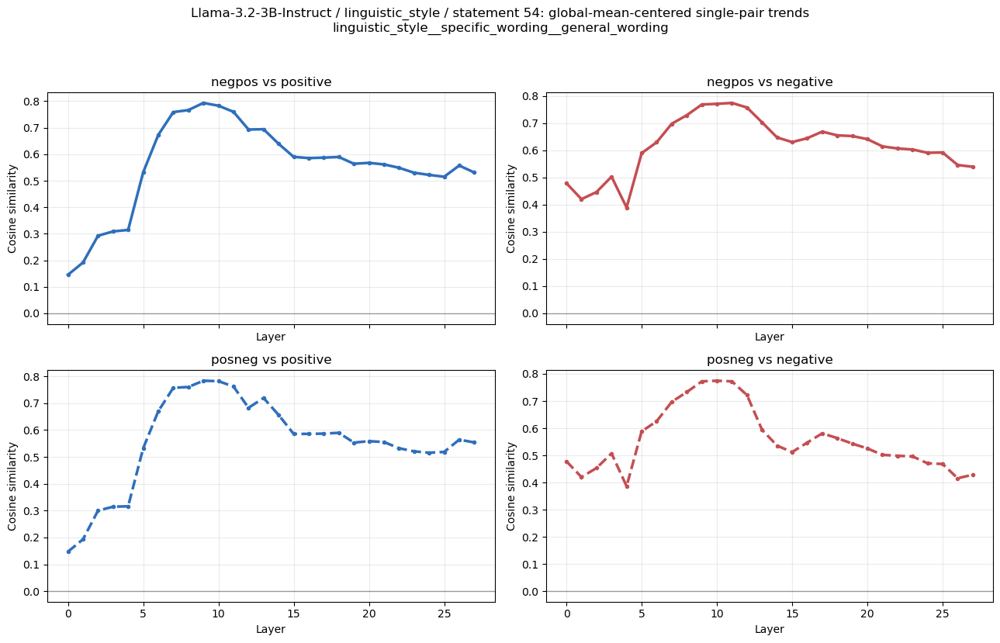

PosixPath('contrast_sanity_outputs/concatenate_cos/single_pair_statement_global_mean_centered/Llama-3.2-3B-Instruct_linguistic_style_linguistic_style__specific_wording__general_wording_statement_54_global-mean-centered_trends.png')

In [31]:
single_pair_statement_df = compute_single_pair_statement_cosines(
    model_name="Llama-3.2-3B-Instruct",
    category="linguistic_style",
    pair_slug="linguistic_style__specific_wording__general_wording",
    statement_index=54,
    use_global_mean=SINGLE_USE_GLOBAL_MEAN,
)

single_csv_dir = OUTPUT_DIR / "single_pair_statement_tables"
single_csv_dir.mkdir(parents=True, exist_ok=True)
single_csv_path = single_csv_dir / (
    f"{"Llama-3.2-3B-Instruct"}_{SINGLE_CATEGORY}_{SINGLE_PAIR_SLUG}_statement_{SINGLE_STATEMENT_INDEX}_"
    f"{'global_mean_centered' if SINGLE_USE_GLOBAL_MEAN else 'raw'}.csv"
)
single_pair_statement_df.to_csv(single_csv_path, index=False)
print("Saved:", single_csv_path)
display(single_pair_statement_df.head(12))
plot_single_pair_statement_cosines(single_pair_statement_df)

{"judge_model": "google/gemma-3-4b-it", "generation_file": "outputs/generations_llama32_negpos_full/Llama-3.2-3B-Instruct/linguistic_style/linguistic_style__specific_wording__general_wording/negpos/generations.jsonl", "combined_order": "negpos", "first_concept": "general wording", "second_concept": "specific wording", "success": 1, "score": 1, "judgement": "Success: 1\nExplanation: The response clearly addresses both general and specific wording, using them to discuss the original statement and providing distinct explanations for each.", "category_name": "LINGUISTIC STYLE", "category_key": "linguistic_style", "pair_slug": "linguistic_style__specific_wording__general_wording", "positive_concept": "specific wording", "negative_concept": "general wording", "statement_index": 54, "statement_source": "class_1.txt", "statement": "People believe what they want to believe.", "variant": "negpos", "generated_text": "**General Wording:** The notion that people tend to accept information that aligns with their pre-existing desires, biases, or expectations can be a pervasive phenomenon in human psychology. This concept is often referred to as the \"confirmation bias\" or \"selective perception.\" It suggests that individuals selectively process and interpret information in a way that reinforces their existing worldview, rather than considering alternative perspectives.\n\n**Specific Wording:** Research has consistently shown that people's perceptions of reality are often influenced by their personal interests, values, and motivations. For instance, individuals may seek out information that confirms their preconceived notions about a particular issue or topic, while dismissing or downplaying contradictory evidence. This selective attention can lead to a distorted view of reality, where people become increasingly entrenched in their beliefs, even when faced with contradictory data or expert opinions. As a result, it is essential for individuals to critically evaluate information, consider diverse perspectives, and remain open to changing their minds when presented with compelling evidence."}

{"judge_model": "google/gemma-3-4b-it", "generation_file": "outputs/generations_llama32_posneg_full/Llama-3.2-3B-Instruct/linguistic_style/linguistic_style__specific_wording__general_wording/posneg/generations.jsonl", "combined_order": "posneg", "first_concept": "specific wording", "second_concept": "general wording", "success": 1, "score": 1, "judgement": "Success: 1\nExplanation: The response clearly distinguishes between the specific and general wording of the statement, presenting them as two distinct perspectives on the underlying concept.", "category_name": "LINGUISTIC STYLE", "category_key": "linguistic_style", "pair_slug": "linguistic_style__specific_wording__general_wording", "positive_concept": "specific wording", "negative_concept": "general wording", "statement_index": 54, "statement_source": "class_1.txt", "statement": "People believe what they want to believe.", "variant": "posneg", "generated_text": "The notion that people believe what they want to believe is a concept rooted in cognitive psychology and social influence theory. This statement acknowledges the complex interplay between an individual's desires, perceptions, and the information they choose to accept or reject.\n\nOn one hand, this perspective suggests that people's beliefs are often driven by their personal preferences, values, and emotions. They tend to seek out information that confirms their pre-existing convictions, while ignoring or dismissing contradictory evidence. This phenomenon is often referred to as \"confirmation bias.\" As a result, individuals may selectively expose themselves to information that aligns with their desired worldview, thereby reinforcing their existing beliefs.\n\nOn the other hand, this statement also implies that people's beliefs can be shaped by external factors, such as social pressures, cultural norms, and authority figures. The desire to conform to societal expectations or avoid social disapproval can lead individuals to adopt certain beliefs or attitudes, even if they do not necessarily align with their own personal convictions. This highlights the role of social influence in shaping our beliefs and the importance of critically evaluating information from multiple sources.\n\nUltimately, the idea that people believe what they want to believe raises important questions about the nature of reality, the role of perception, and the complexities of human cognition. While it is true that people's beliefs are often influenced by a range of factors, it is equally true that individuals have the capacity for critical thinking and can challenge their own assumptions and biases. A nuanced understanding of this dynamic is essential for fostering informed decision-making, effective communication, and meaningful dialogue."}

Saved: contrast_sanity_outputs/concatenate_cos/single_pair_statement_tables/Qwen2.5-3B-Instruct_semantic_framing_semantic_framing__performance_perspective__safety_perspective_statement_0_global_mean_centered.csv


,model,category,pair_slug,statement_index,centered,concat_variant,reference_variant,layer,cosine
0,Qwen2.5-3B-Instruct,linguistic_style,linguistic_style__bullet_point_style__paragrap...,24,True,negpos,positive,0,0.420145
1,Qwen2.5-3B-Instruct,linguistic_style,linguistic_style__bullet_point_style__paragrap...,24,True,negpos,negative,0,-0.146496
2,Qwen2.5-3B-Instruct,linguistic_style,linguistic_style__bullet_point_style__paragrap...,24,True,posneg,positive,0,0.402558
3,Qwen2.5-3B-Instruct,linguistic_style,linguistic_style__bullet_point_style__paragrap...,24,True,posneg,negative,0,-0.113470
4,Qwen2.5-3B-Instruct,linguistic_style,linguistic_style__bullet_point_style__paragrap...,24,True,negpos,positive,1,0.205699
5,Qwen2.5-3B-Instruct,linguistic_style,linguistic_style__bullet_point_style__paragrap...,24,True,negpos,negative,1,-0.234949
6,Qwen2.5-3B-Instruct,linguistic_style,linguistic_style__bullet_point_style__paragrap...,24,True,posneg,positive,1,0.221472
7,Qwen2.5-3B-Instruct,linguistic_style,linguistic_style__bullet_point_style__paragrap...,24,True,posneg,negative,1,-0.190404
8,Qwen2.5-3B-Instruct,linguistic_style,linguistic_style__bullet_point_style__paragrap...,24,True,negpos,positive,2,0.258713
9,Qwen2.5-3B-Instruct,linguistic_style,linguistic_style__bullet_point_style__paragrap...,24,True,negpos,negative,2,-0.136346


Saved: contrast_sanity_outputs/concatenate_cos/single_pair_statement_global_mean_centered/Qwen2.5-3B-Instruct_linguistic_style_linguistic_style__bullet_point_style__paragraph_style_statement_24_global-mean-centered_trends.png


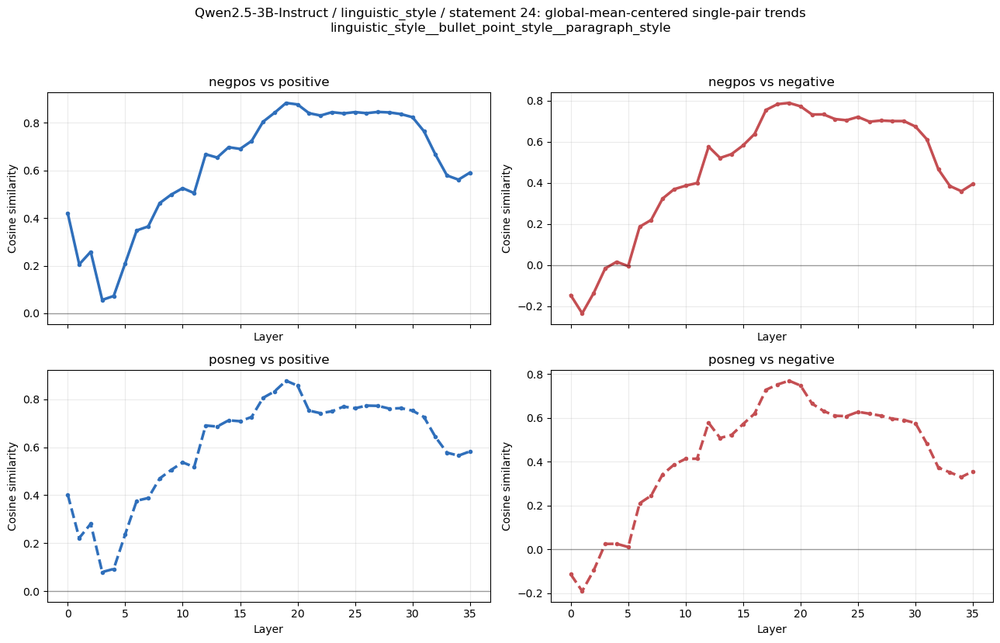

PosixPath('contrast_sanity_outputs/concatenate_cos/single_pair_statement_global_mean_centered/Qwen2.5-3B-Instruct_linguistic_style_linguistic_style__bullet_point_style__paragraph_style_statement_24_global-mean-centered_trends.png')

In [37]:
single_pair_statement_df = compute_single_pair_statement_cosines(
    model_name="Qwen2.5-3B-Instruct",
    category="linguistic_style",
    pair_slug="linguistic_style__bullet_point_style__paragraph_style",
    statement_index=24,
    use_global_mean=SINGLE_USE_GLOBAL_MEAN,
)

single_csv_dir = OUTPUT_DIR / "single_pair_statement_tables"
single_csv_dir.mkdir(parents=True, exist_ok=True)
single_csv_path = single_csv_dir / (
    f"{"Qwen2.5-3B-Instruct"}_{SINGLE_CATEGORY}_{SINGLE_PAIR_SLUG}_statement_{SINGLE_STATEMENT_INDEX}_"
    f"{'global_mean_centered' if SINGLE_USE_GLOBAL_MEAN else 'raw'}.csv"
)
single_pair_statement_df.to_csv(single_csv_path, index=False)
print("Saved:", single_csv_path)
display(single_pair_statement_df.head(12))
plot_single_pair_statement_cosines(single_pair_statement_df)

{"judge_model": "google/gemma-3-4b-it", "generation_file": "outputs/generations_negpos_full/Qwen2.5-3B-Instruct/linguistic_style/linguistic_style__bullet_point_style__paragraph_style/negpos/generations.jsonl", "combined_order": "negpos", "first_concept": "paragraph style", "second_concept": "bullet-point style", "success": 0, "score": 0, "judgement": "Success: 0\nExplanation: The response presents a textual paragraph and a bulleted list, but it fails to address the prompt’s request to consider both paragraph and bullet-point styles as distinct approaches to presenting the statement’s meaning.", "category_name": "LINGUISTIC STYLE", "category_key": "linguistic_style", "pair_slug": "linguistic_style__bullet_point_style__paragraph_style", "positive_concept": "bullet-point style", "negative_concept": "paragraph style", "statement_index": 24, "statement_source": "class_1.txt", "statement": "Regret is a heavier burden than failure.", "variant": "negpos", "generated_text": "��\nThoughts:\n\nThe statement \"Regret is a heavier burden than failure\" suggests a profound perspective on human emotions and their impact on well-being. It implies that dwelling on past decisions or actions (regret) can be emotionally taxing and may cause more distress than simply acknowledging a mistake or setback (failure). This sentiment resonates with many people who have experienced both regret and failure in their lives.\n\nBullet-point:\n\n- Regret often involves intense emotional pain from not making the best choices.\n- It can lead to self-criticism and negative self-image.\n- Failure, while disappointing, might not carry the same weight of emotional attachment as regret.\n- Overthinking past events can consume one's mental energy and prevent moving forward.\n- Acknowledging failure can sometimes lead to learning and growth, which is healthier than enduring regret indefinitely."}

{"judge_model": "google/gemma-3-4b-it", "generation_file": "outputs/generations_posneg_full/Qwen2.5-3B-Instruct/linguistic_style/linguistic_style__bullet_point_style__paragraph_style/posneg/generations.jsonl", "combined_order": "posneg", "first_concept": "bullet-point style", "second_concept": "paragraph style", "success": 0, "score": 0, "judgement": "Success: 0\nExplanation: The response primarily uses a paragraph style and does not effectively incorporate the requested bullet-point style.", "category_name": "LINGUISTIC STYLE", "category_key": "linguistic_style", "pair_slug": "linguistic_style__bullet_point_style__paragraph_style", "positive_concept": "bullet-point style", "negative_concept": "paragraph style", "statement_index": 24, "statement_source": "class_1.txt", "statement": "Regret is a heavier burden than failure.", "variant": "posneg", "generated_text": "昵称Qwen，我是阿里云开发的一款预训练模型。关于您提供的这句话：“后悔比失败更沉重的负担”，我的理解是，这句话强调了后悔的情感和心理影响，通常意味着一个人在做出某个决定后意识到自己的选择可能是错误的，并为此感到痛苦和内疚。这种情绪不仅可能导致个人的心理压力增加，还可能影响到人际关系和社会互动。\n\n与之相比，失败本身虽然也具有负面意义，但它通常是一个可以被接受的事实，人们可以从中吸取教训并继续前进。相比之下，后悔往往伴随着更多的自我怀疑和否定，可能会导致个人陷入长期的情绪困扰中。\n\n从这个角度来看，尽管失败本身可能带来一定的挑战和痛苦，但它们往往是成长的一部分，而后悔则可能持续消耗个体的能量，阻碍个人的成长和发展。因此，虽然两者都可能对个体造成负面影响，但从长远来看，避免或减少后悔可能更有助于个人的全面发展和心理健康。"}

Saved: contrast_sanity_outputs/concatenate_cos/concatenate_pos_minus_neg_layer_trends.csv
Saved: contrast_sanity_outputs/concatenate_cos/Llama-3.2-3B-Instruct_concat_pos_minus_neg_layer_trends.png


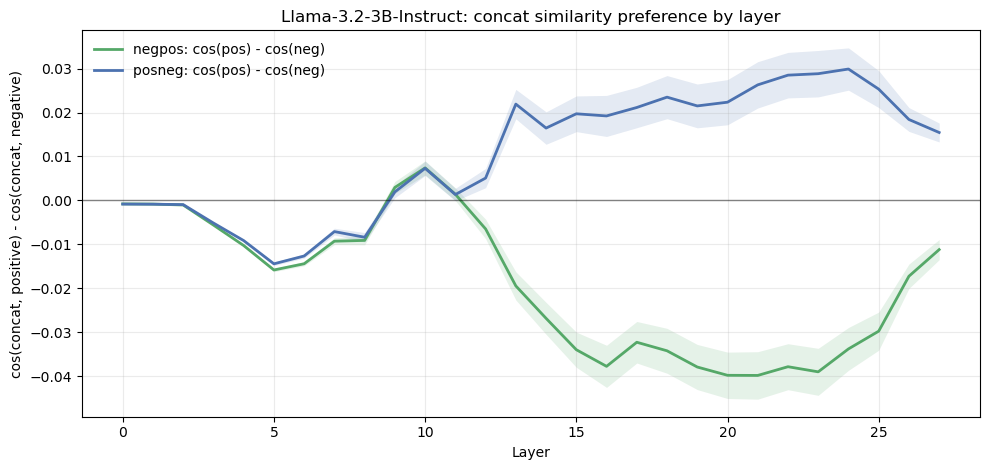

Saved: contrast_sanity_outputs/concatenate_cos/Qwen2.5-1.5B-Instruct_concat_pos_minus_neg_layer_trends.png


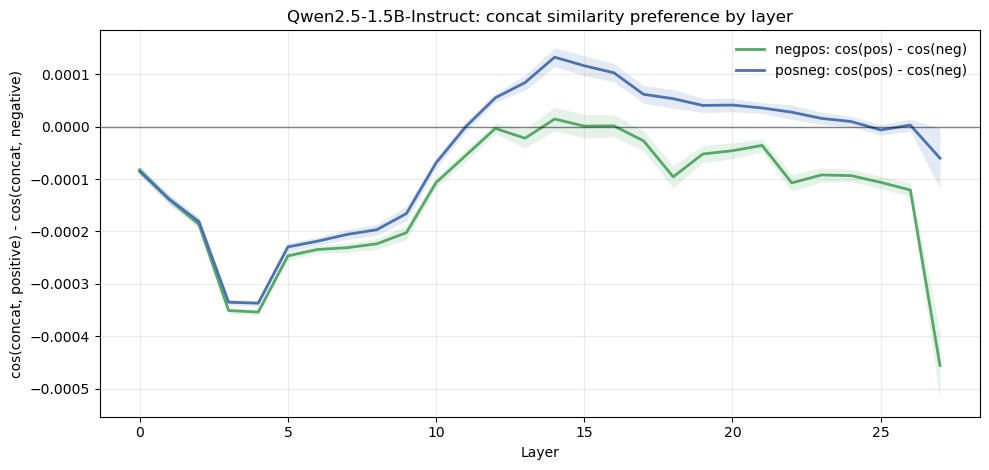

Saved: contrast_sanity_outputs/concatenate_cos/Qwen2.5-3B-Instruct_concat_pos_minus_neg_layer_trends.png


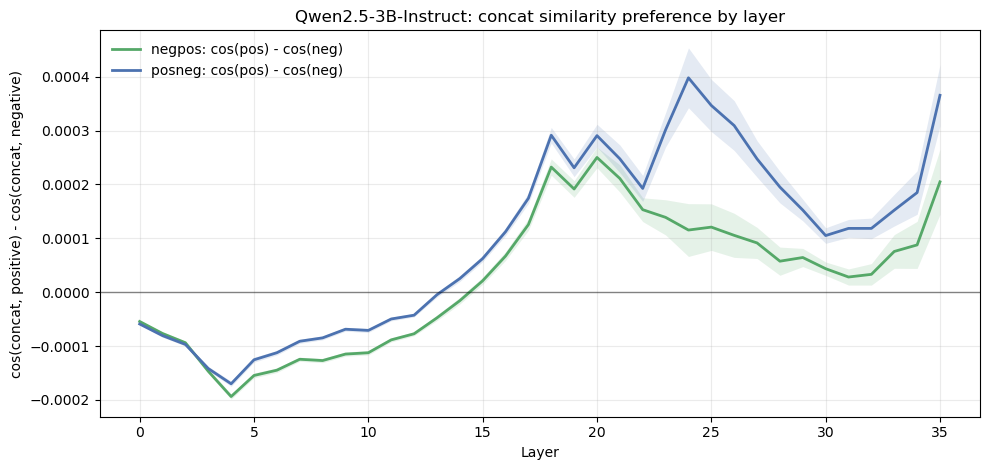

In [6]:
diff_agg_df = (
    diff_df
    .groupby(["model", "concat_variant", "layer"], as_index=False)
    .agg(
        positive_minus_negative=("positive_minus_negative", "mean"),
        std_across_pairs=("positive_minus_negative", "std"),
        n_pairs=("pair_slug", "nunique"),
    )
)
diff_agg_df["sem_across_pairs"] = diff_agg_df["std_across_pairs"] / np.sqrt(diff_agg_df["n_pairs"].clip(lower=1))
diff_agg_path = OUTPUT_DIR / "concatenate_pos_minus_neg_layer_trends.csv"
diff_agg_df.to_csv(diff_agg_path, index=False)
print("Saved:", diff_agg_path)

for model_name, model_df in diff_agg_df.groupby("model"):
    fig, ax = plt.subplots(figsize=(10, 4.8))
    for concat_variant, group_df in model_df.groupby("concat_variant"):
        group_df = group_df.sort_values("layer")
        color = "#4c72b0" if concat_variant == "posneg" else "#55a868"
        ax.plot(
            group_df["layer"],
            group_df["positive_minus_negative"],
            linewidth=2,
            label=f"{concat_variant}: cos(pos) - cos(neg)",
            color=color,
        )
        ax.fill_between(
            group_df["layer"].to_numpy(),
            (group_df["positive_minus_negative"] - group_df["sem_across_pairs"]).to_numpy(),
            (group_df["positive_minus_negative"] + group_df["sem_across_pairs"]).to_numpy(),
            color=color,
            alpha=0.15,
            linewidth=0,
        )
    ax.axhline(0, color="black", linewidth=1, alpha=0.45)
    ax.set_title(f"{model_name}: concat similarity preference by layer")
    ax.set_xlabel("Layer")
    ax.set_ylabel("cos(concat, positive) - cos(concat, negative)")
    ax.grid(alpha=0.25)
    ax.legend(frameon=False)
    fig.tight_layout()
    out_path = OUTPUT_DIR / f"{model_name}_concat_pos_minus_neg_layer_trends.png"
    fig.savefig(out_path, dpi=180)
    print("Saved:", out_path)
    plt.show()

## Category-level cosine means

These cells keep the same four raw cosine similarities as above, but aggregate them within each category. The first plot type shows layer trends averaged over pairs inside a category.


Saved: contrast_sanity_outputs/concatenate_cos/category_layer_cosine_means.csv
Saved: contrast_sanity_outputs/concatenate_cos/category_overall_cosine_means.csv


,model,category,concat_variant,reference_variant,mean_cos,std_across_pair_layers,n_pairs,n_layers,n_rows_total
0,Llama-3.2-3B-Instruct,ideology,negpos,negative,0.719410,0.149199,50,28,140000
1,Llama-3.2-3B-Instruct,ideology,negpos,positive,0.707142,0.153968,50,28,140000
2,Llama-3.2-3B-Instruct,ideology,posneg,negative,0.708144,0.157247,50,28,140000
3,Llama-3.2-3B-Instruct,ideology,posneg,positive,0.719918,0.145283,50,28,140000
4,Llama-3.2-3B-Instruct,linguistic_style,negpos,negative,0.727321,0.158746,50,28,140000
5,Llama-3.2-3B-Instruct,linguistic_style,negpos,positive,0.703197,0.174247,50,28,140000
6,Llama-3.2-3B-Instruct,linguistic_style,posneg,negative,0.712285,0.169301,50,28,140000
7,Llama-3.2-3B-Instruct,linguistic_style,posneg,positive,0.715448,0.164300,50,28,140000
8,Llama-3.2-3B-Instruct,semantic_framing,negpos,negative,0.713011,0.158038,50,28,140000
9,Llama-3.2-3B-Instruct,semantic_framing,negpos,positive,0.692260,0.171521,50,28,140000


Saved: contrast_sanity_outputs/concatenate_cos/category_layer_trends/Llama-3.2-3B-Instruct_ideology_category_layer_trends.png


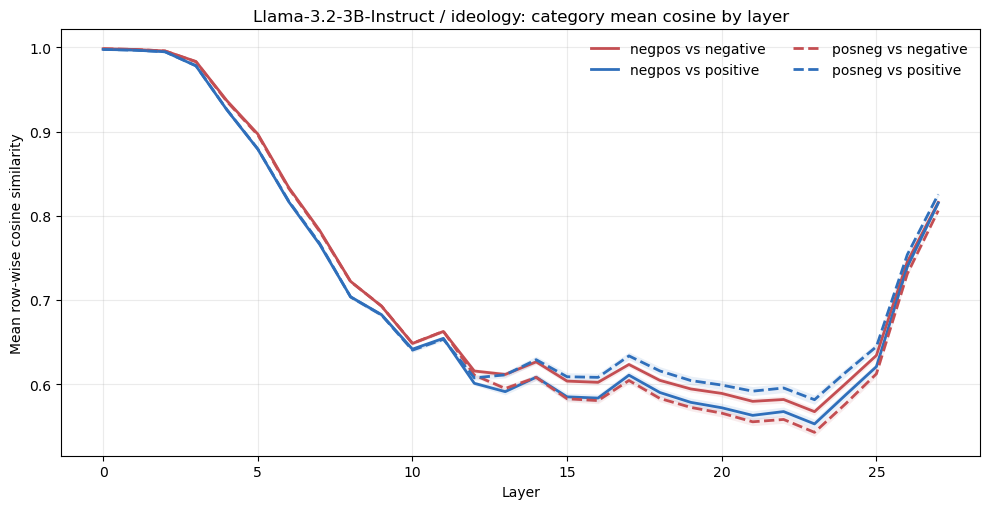

Saved: contrast_sanity_outputs/concatenate_cos/category_layer_trends/Llama-3.2-3B-Instruct_linguistic_style_category_layer_trends.png


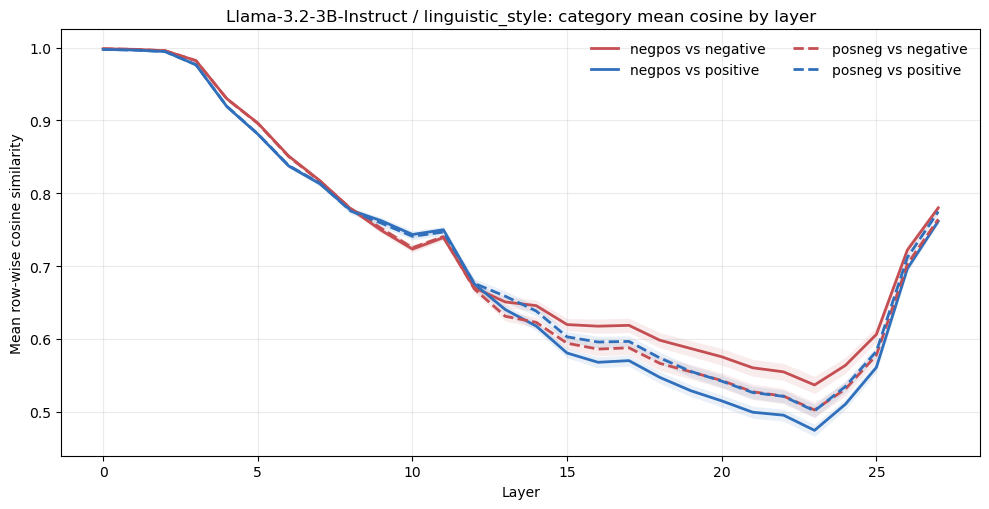

Saved: contrast_sanity_outputs/concatenate_cos/category_layer_trends/Llama-3.2-3B-Instruct_semantic_framing_category_layer_trends.png


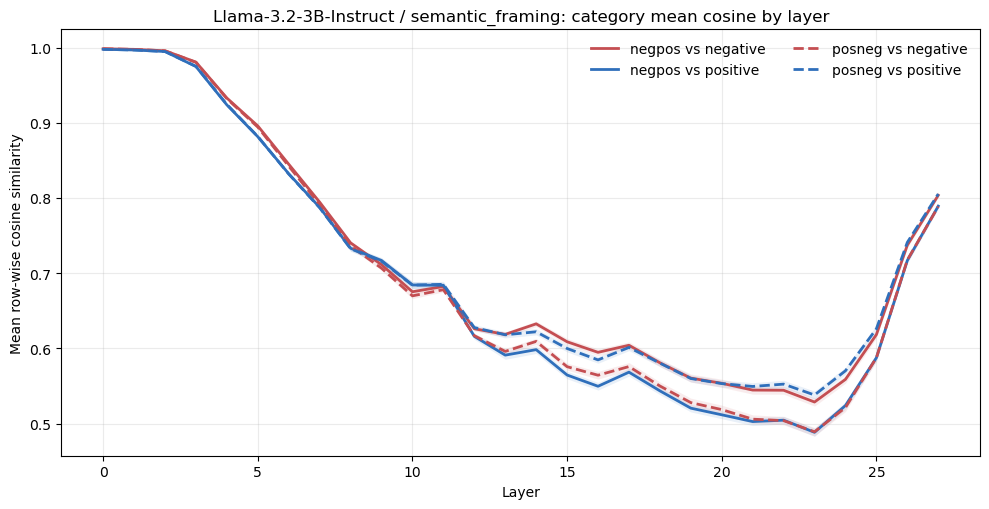

Saved: contrast_sanity_outputs/concatenate_cos/category_layer_trends/Qwen2.5-1.5B-Instruct_ideology_category_layer_trends.png


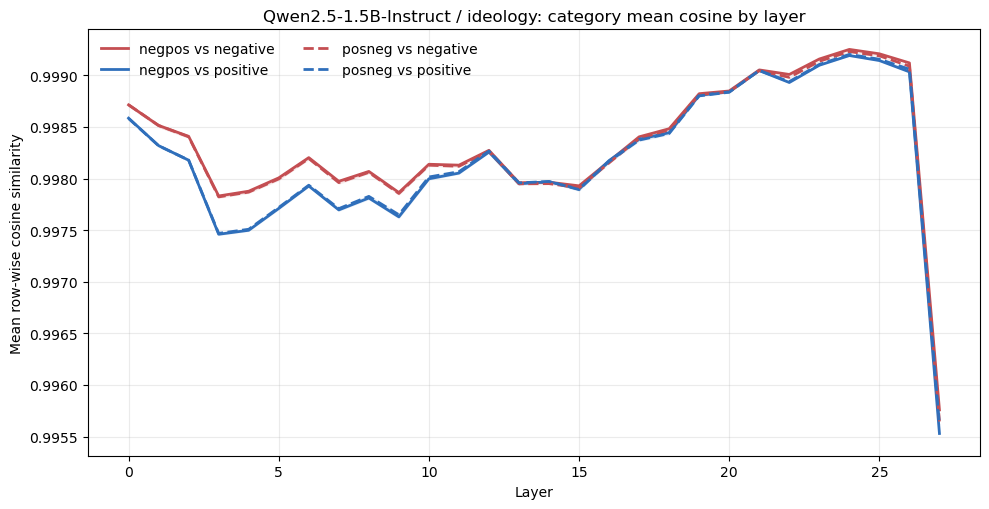

Saved: contrast_sanity_outputs/concatenate_cos/category_layer_trends/Qwen2.5-1.5B-Instruct_linguistic_style_category_layer_trends.png


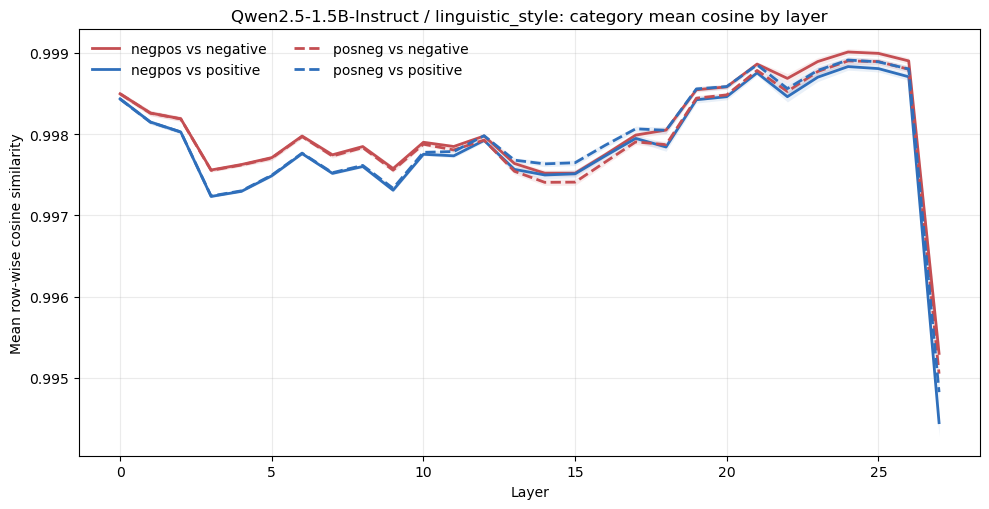

Saved: contrast_sanity_outputs/concatenate_cos/category_layer_trends/Qwen2.5-1.5B-Instruct_semantic_framing_category_layer_trends.png


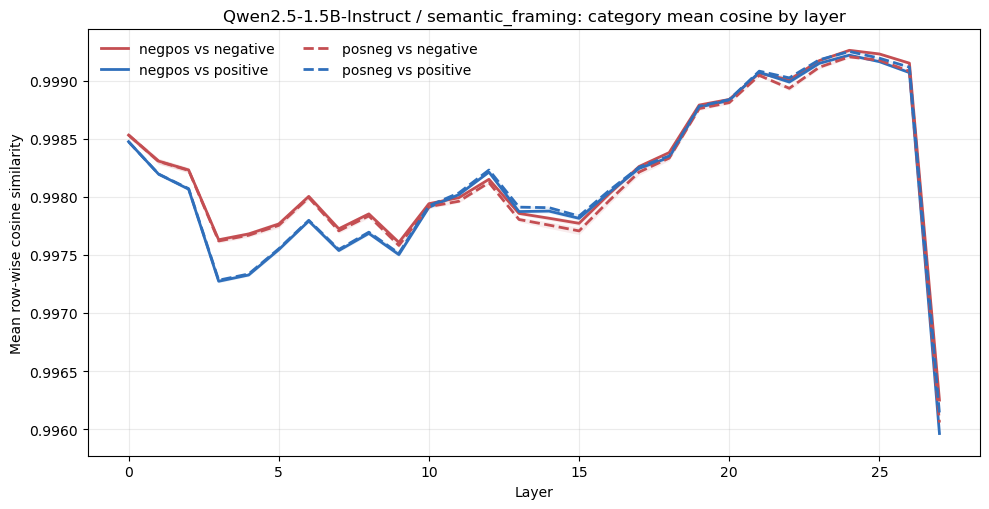

Saved: contrast_sanity_outputs/concatenate_cos/category_layer_trends/Qwen2.5-3B-Instruct_ideology_category_layer_trends.png


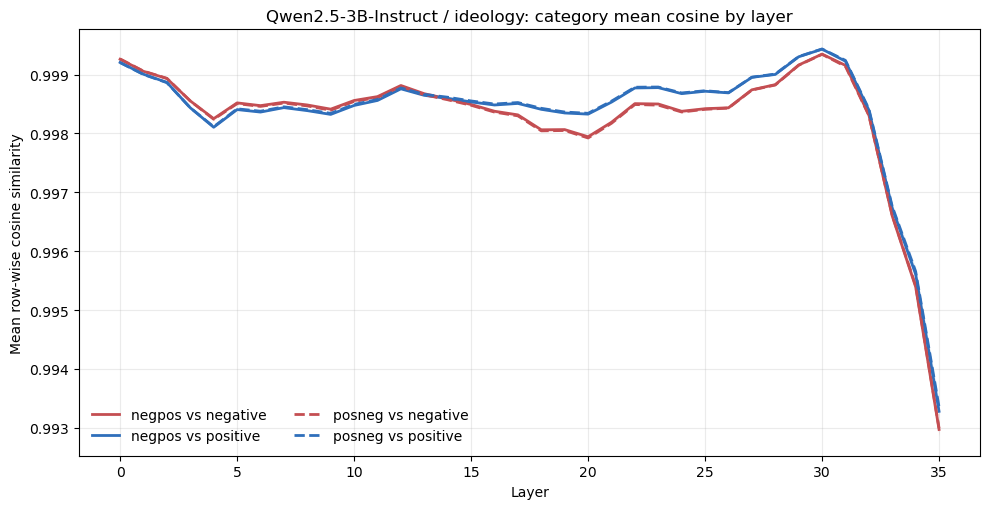

Saved: contrast_sanity_outputs/concatenate_cos/category_layer_trends/Qwen2.5-3B-Instruct_linguistic_style_category_layer_trends.png


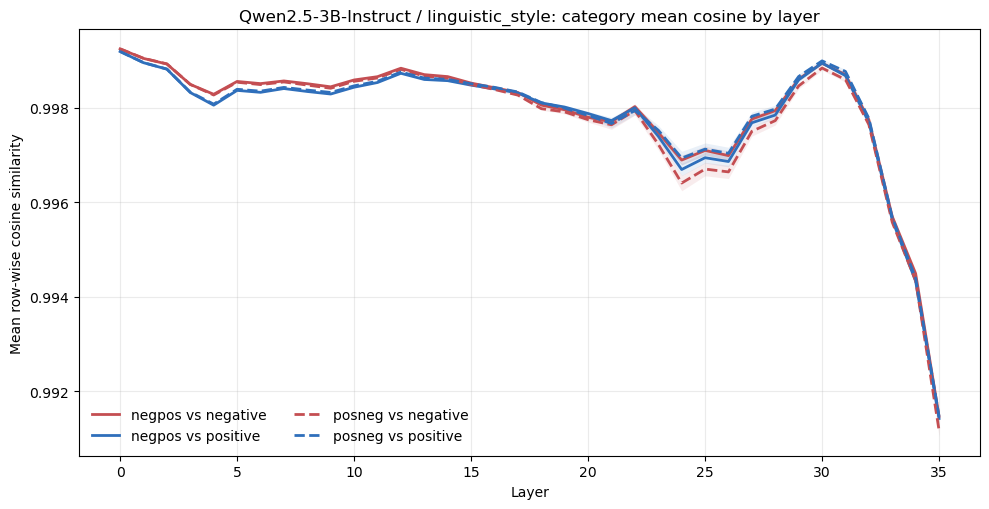

Saved: contrast_sanity_outputs/concatenate_cos/category_layer_trends/Qwen2.5-3B-Instruct_semantic_framing_category_layer_trends.png


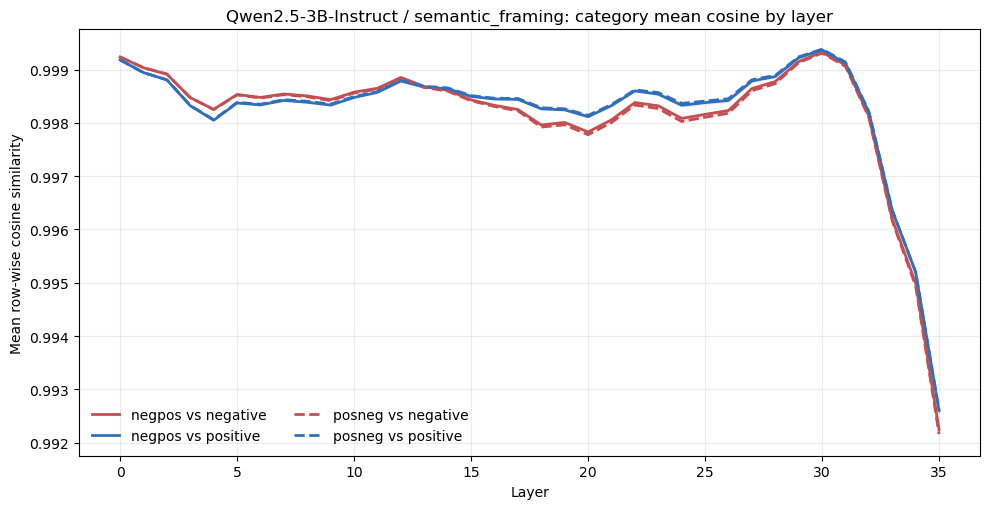

In [15]:
category_layer_df = (
    cos_df
    .groupby(["model", "category", "concat_variant", "reference_variant", "layer"], as_index=False)
    .agg(
        mean_cos=("mean_cos", "mean"),
        std_across_pairs=("mean_cos", "std"),
        n_pairs=("pair_slug", "nunique"),
        n_rows_total=("n_rows", "sum"),
    )
)
category_layer_df["sem_across_pairs"] = category_layer_df["std_across_pairs"] / np.sqrt(
    category_layer_df["n_pairs"].clip(lower=1)
)

category_mean_df = (
    cos_df
    .groupby(["model", "category", "concat_variant", "reference_variant"], as_index=False)
    .agg(
        mean_cos=("mean_cos", "mean"),
        std_across_pair_layers=("mean_cos", "std"),
        n_pairs=("pair_slug", "nunique"),
        n_layers=("layer", "nunique"),
        n_rows_total=("n_rows", "sum"),
    )
)

category_layer_path = OUTPUT_DIR / "category_layer_cosine_means.csv"
category_mean_path = OUTPUT_DIR / "category_overall_cosine_means.csv"
category_layer_df.to_csv(category_layer_path, index=False)
category_mean_df.to_csv(category_mean_path, index=False)
print("Saved:", category_layer_path)
print("Saved:", category_mean_path)
display(category_mean_df.head(12))

category_plot_dir = OUTPUT_DIR / "category_layer_trends"
category_plot_dir.mkdir(parents=True, exist_ok=True)

for (model_name, category), group in category_layer_df.groupby(["model", "category"]):
    fig, ax = plt.subplots(figsize=(10, 5.2))
    for (concat_variant, reference_variant), line_df in group.groupby(["concat_variant", "reference_variant"]):
        line_df = line_df.sort_values("layer")
        style = STYLE[(concat_variant, reference_variant)]
        ax.plot(
            line_df["layer"],
            line_df["mean_cos"],
            color=style["color"],
            linestyle=style["linestyle"],
            linewidth=2,
            label=style["label"],
        )
        ax.fill_between(
            line_df["layer"].to_numpy(),
            (line_df["mean_cos"] - line_df["sem_across_pairs"]).to_numpy(),
            (line_df["mean_cos"] + line_df["sem_across_pairs"]).to_numpy(),
            color=style["color"],
            alpha=0.10,
            linewidth=0,
        )
    ax.set_title(f"{model_name} / {category}: category mean cosine by layer")
    ax.set_xlabel("Layer")
    ax.set_ylabel("Mean row-wise cosine similarity")
    ax.grid(alpha=0.25)
    ax.legend(frameon=False, ncols=2)
    fig.tight_layout()
    out_path = category_plot_dir / f"{model_name}_{category}_category_layer_trends.png"
    fig.savefig(out_path, dpi=180)
    print("Saved:", out_path)
    plt.show()


## Pair-level layer trends within each category

These plots keep each pair as its own layer-trend line. For every `model + category`, the figure has four panels, one for each cosine condition. Each panel overlays the 50 pair curves in that category and adds a black mean curve.


Saved: contrast_sanity_outputs/concatenate_cos/category_pair_layer_cosine_trends.csv


,model,category,pair_slug,concat_variant,reference_variant,layer,mean_cos,std_across_rows,n_rows_total
0,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,negative,0,0.998457,0.000650,100
1,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,negative,1,0.997626,0.000877,100
2,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,negative,2,0.995862,0.001286,100
3,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,negative,3,0.983389,0.004040,100
4,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,negative,4,0.935791,0.021404,100
5,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,negative,5,0.898086,0.041623,100
6,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,negative,6,0.841514,0.082104,100
7,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,negative,7,0.793169,0.112113,100
8,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,negative,8,0.730451,0.128849,100
9,Llama-3.2-3B-Instruct,ideology,ideology__centralization_support__decentraliza...,negpos,negative,9,0.696079,0.143267,100


Saved: contrast_sanity_outputs/concatenate_cos/category_pair_layer_trends/Llama-3.2-3B-Instruct_ideology_pair_layer_trends.png


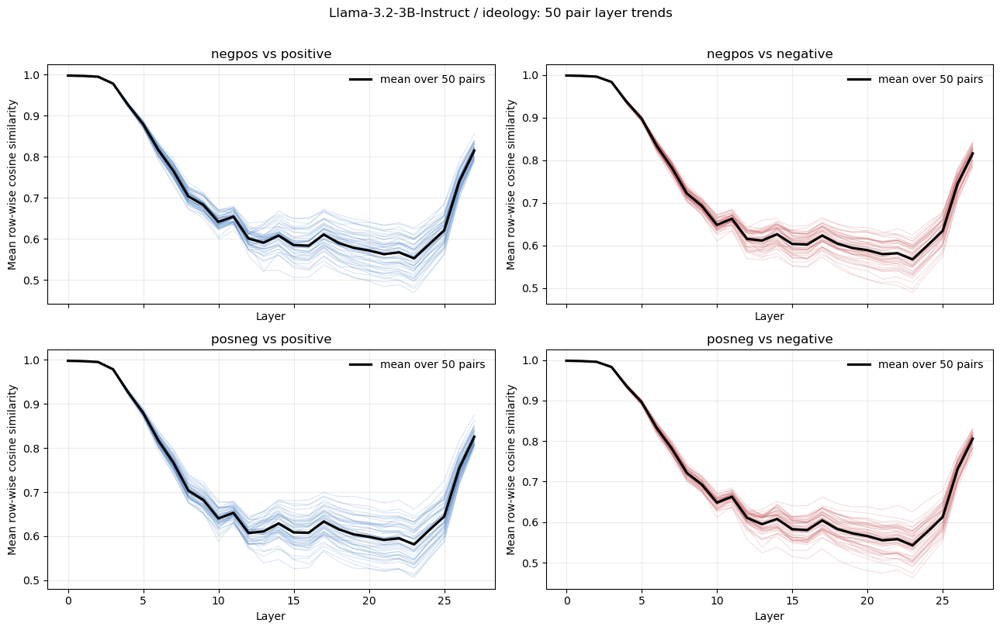

Saved: contrast_sanity_outputs/concatenate_cos/category_pair_layer_trends/Llama-3.2-3B-Instruct_linguistic_style_pair_layer_trends.png


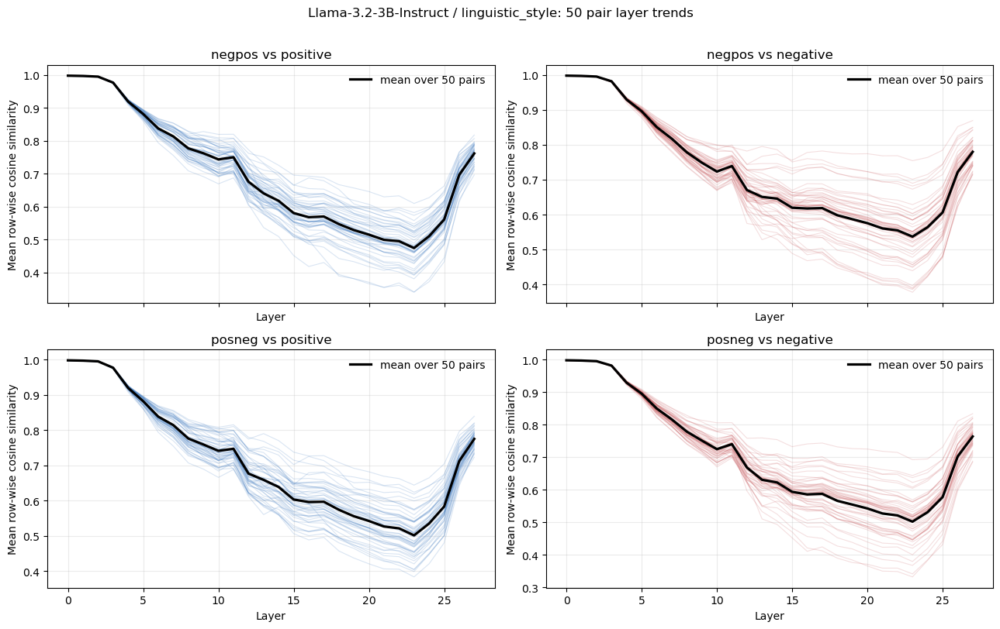

Saved: contrast_sanity_outputs/concatenate_cos/category_pair_layer_trends/Llama-3.2-3B-Instruct_semantic_framing_pair_layer_trends.png


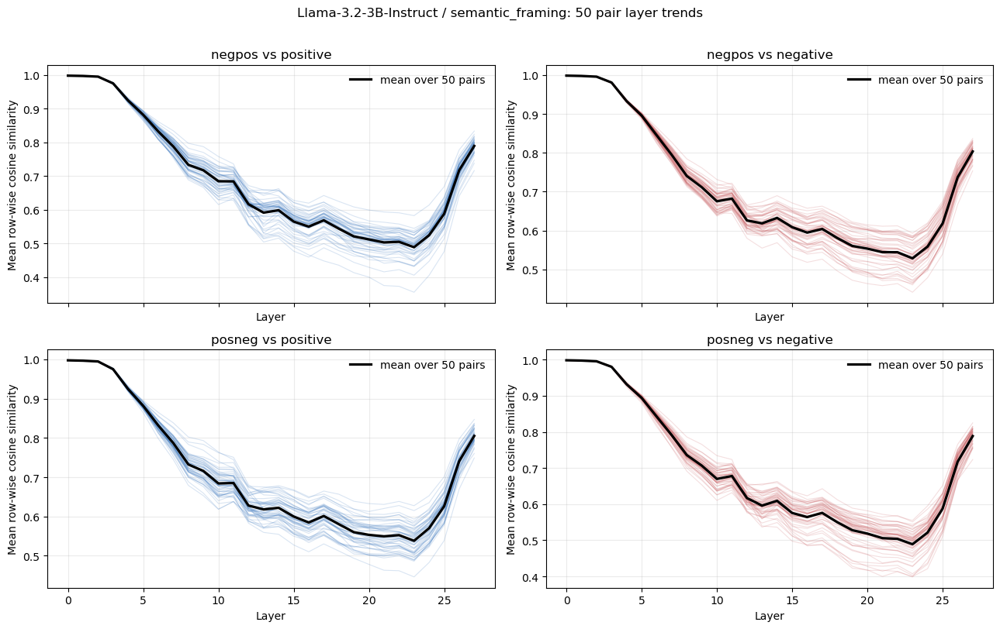

Saved: contrast_sanity_outputs/concatenate_cos/category_pair_layer_trends/Qwen2.5-1.5B-Instruct_ideology_pair_layer_trends.png


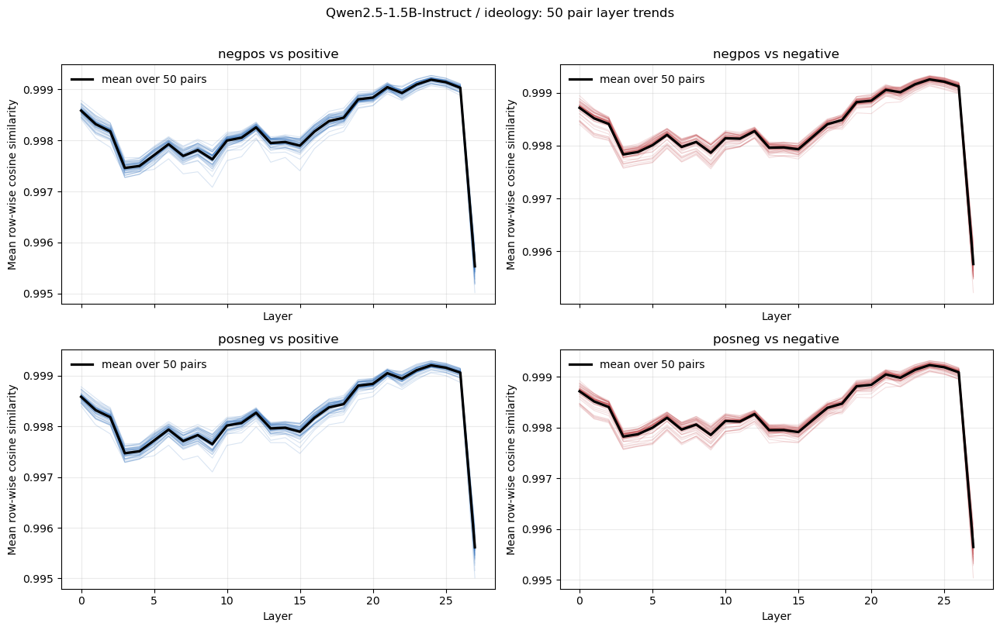

Saved: contrast_sanity_outputs/concatenate_cos/category_pair_layer_trends/Qwen2.5-1.5B-Instruct_linguistic_style_pair_layer_trends.png


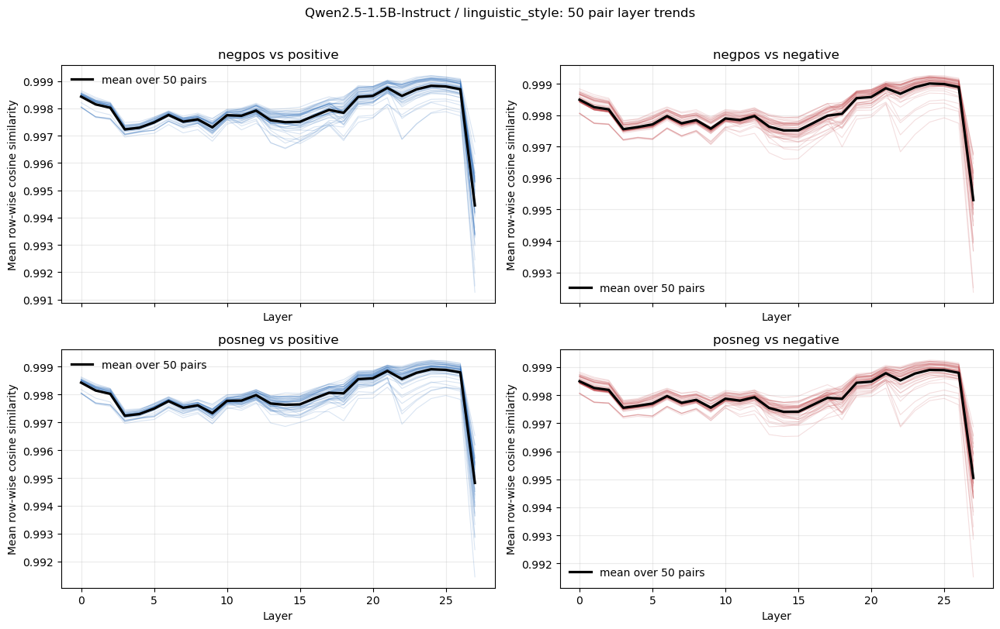

Saved: contrast_sanity_outputs/concatenate_cos/category_pair_layer_trends/Qwen2.5-1.5B-Instruct_semantic_framing_pair_layer_trends.png


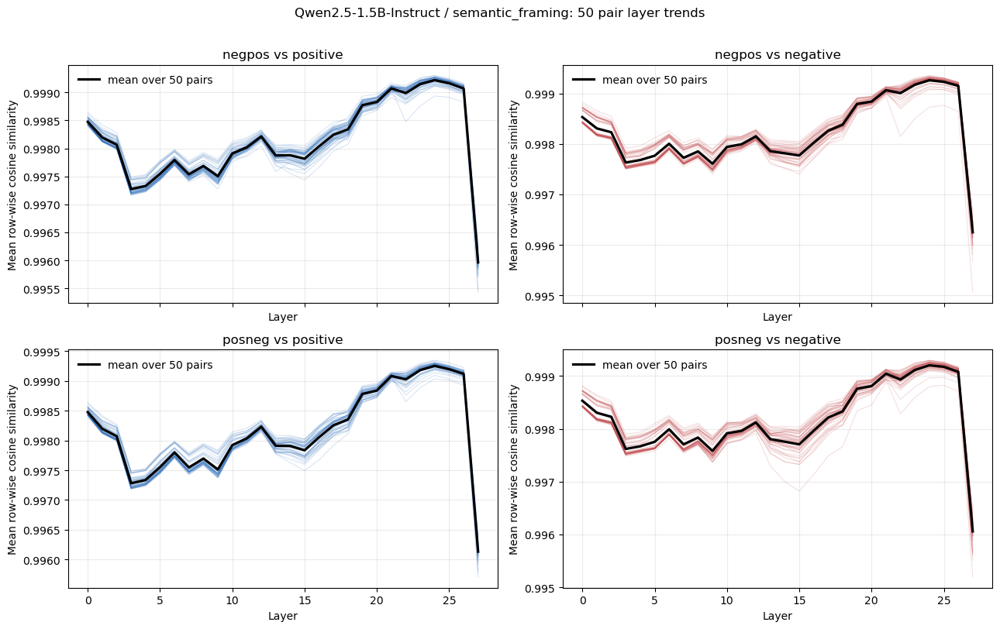

Saved: contrast_sanity_outputs/concatenate_cos/category_pair_layer_trends/Qwen2.5-3B-Instruct_ideology_pair_layer_trends.png


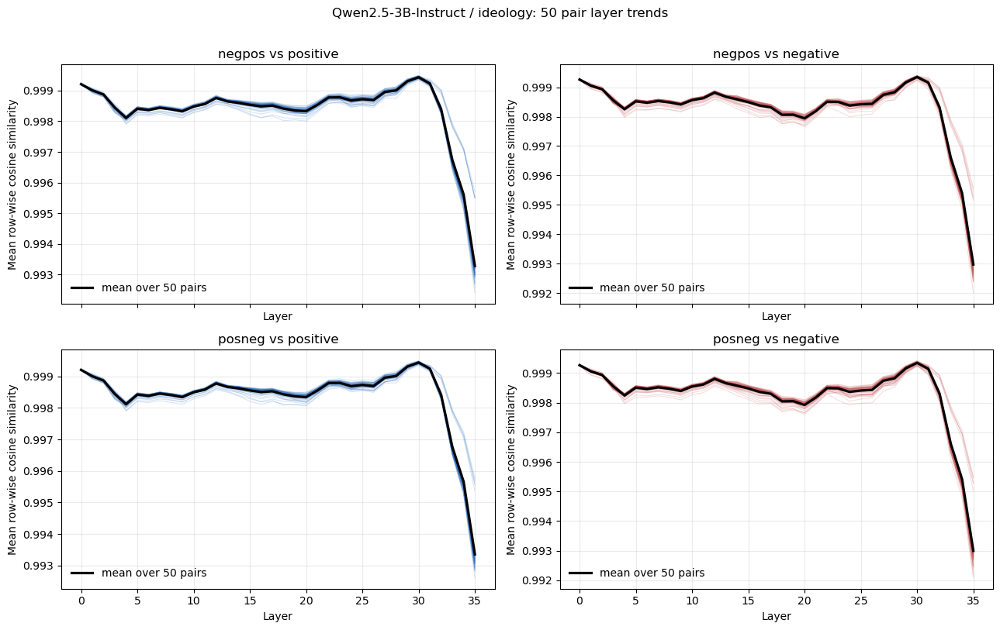

Saved: contrast_sanity_outputs/concatenate_cos/category_pair_layer_trends/Qwen2.5-3B-Instruct_linguistic_style_pair_layer_trends.png


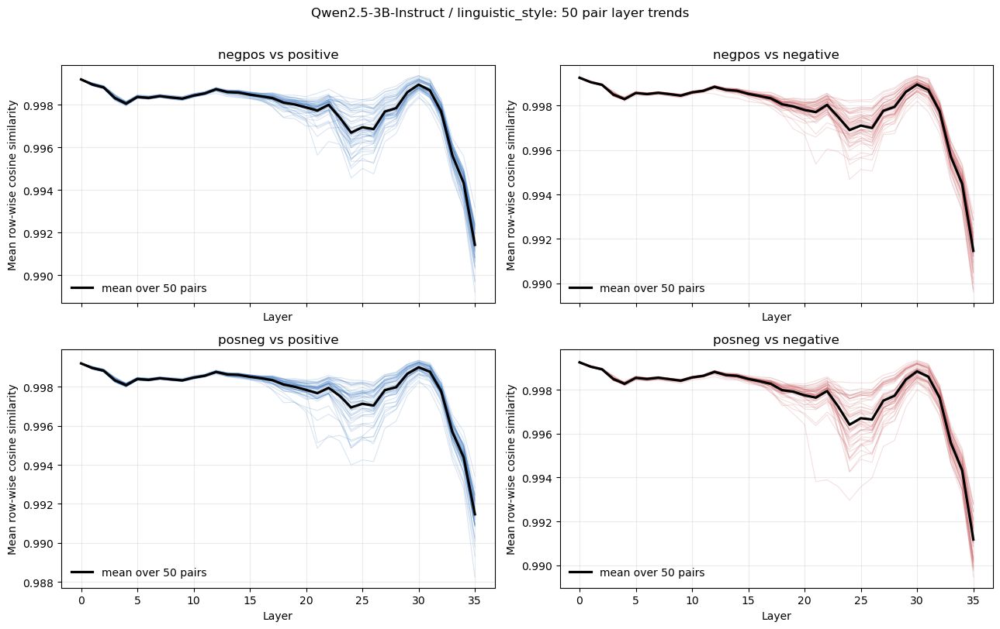

Saved: contrast_sanity_outputs/concatenate_cos/category_pair_layer_trends/Qwen2.5-3B-Instruct_semantic_framing_pair_layer_trends.png


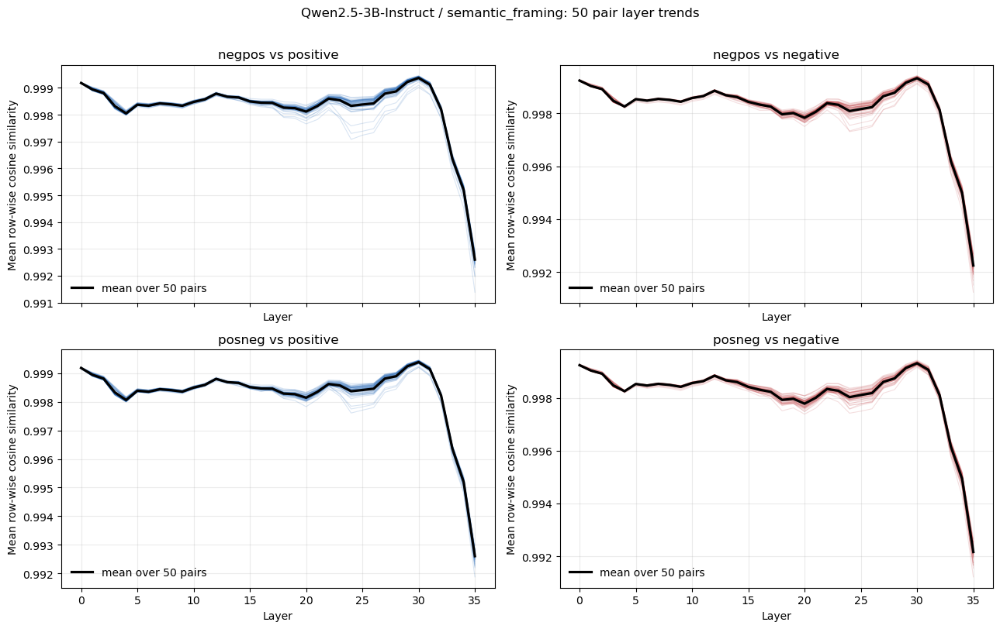

In [16]:
pair_layer_df = (
    cos_df
    .groupby(["model", "category", "pair_slug", "concat_variant", "reference_variant", "layer"], as_index=False)
    .agg(
        mean_cos=("mean_cos", "mean"),
        std_across_rows=("std_cos", "mean"),
        n_rows_total=("n_rows", "sum"),
    )
)

pair_layer_path = OUTPUT_DIR / "category_pair_layer_cosine_trends.csv"
pair_layer_df.to_csv(pair_layer_path, index=False)
print("Saved:", pair_layer_path)
display(pair_layer_df.head(12))

pair_line_plot_dir = OUTPUT_DIR / "category_pair_layer_trends"
pair_line_plot_dir.mkdir(parents=True, exist_ok=True)

PANEL_ORDER = [
    ("negpos", "positive"),
    ("negpos", "negative"),
    ("posneg", "positive"),
    ("posneg", "negative"),
]

for (model_name, category), group in pair_layer_df.groupby(["model", "category"]):
    pair_count = group["pair_slug"].nunique()
    fig, axes = plt.subplots(2, 2, figsize=(13, 8), sharex=True, sharey=False)
    axes = axes.ravel()

    for ax, condition in zip(axes, PANEL_ORDER):
        concat_variant, reference_variant = condition
        condition_df = group[
            group["concat_variant"].eq(concat_variant)
            & group["reference_variant"].eq(reference_variant)
        ]
        style = STYLE[condition]

        for pair_slug, pair_df in condition_df.groupby("pair_slug"):
            pair_df = pair_df.sort_values("layer")
            ax.plot(
                pair_df["layer"],
                pair_df["mean_cos"],
                color=style["color"],
                alpha=0.18,
                linewidth=0.8,
            )

        mean_df = (
            condition_df
            .groupby("layer", as_index=False)
            .agg(mean_cos=("mean_cos", "mean"))
            .sort_values("layer")
        )
        ax.plot(
            mean_df["layer"],
            mean_df["mean_cos"],
            color="black",
            linewidth=2.3,
            label=f"mean over {pair_count} pairs",
        )
        ax.set_title(STYLE[condition]["label"])
        ax.set_xlabel("Layer")
        ax.set_ylabel("Mean row-wise cosine similarity")
        ax.grid(alpha=0.25)
        ax.legend(frameon=False)

    fig.suptitle(f"{model_name} / {category}: 50 pair layer trends", y=1.01)
    fig.tight_layout()
    out_path = pair_line_plot_dir / f"{model_name}_{category}_pair_layer_trends.png"
    fig.savefig(out_path, dpi=180, bbox_inches="tight")
    print("Saved:", out_path)
    plt.show()
